In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/Colab Notebooks/kaggle_API_credentials'

In [4]:
!kaggle datasets download -d kavithak1388/cityscapes

 16% 1.76G/11.0G [01:07<05:52, 28.2MB/s]
User cancelled operation


In [5]:
!kaggle datasets download -d mei1963/gta5-da

  0% 0.00/57.8G [00:00<?, ?B/s]
User cancelled operation


In [6]:
# ! unzip cityscapes.zip

In [7]:
# ! unzip gta5-da.zip

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np


def double_conv_block(x, n_filters):

    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)

    return x
def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.3)(p)

    return f, p

def upsample_block(x, conv_features, n_filters):
    # upsample
    x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    # concatenate
    x = layers.concatenate([x, conv_features])
    # dropout
    x = layers.Dropout(0.3)(x)
    # Conv2D twice with ReLU activation
    x = double_conv_block(x, n_filters)

    return x

In [2]:
def build_unet_model():

    # inputs
    inputs = layers.Input(shape=(128,128,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 64)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 128)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 256)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 512)

    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 1024)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 512)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 256)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 128)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 64)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [5]:
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np


def double_conv_block(x, n_filters):
    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding="same", activation="relu", kernel_initializer="he_normal")(x)
    x = layers.Conv2D(n_filters, 3, padding="same", activation="relu", kernel_initializer="he_normal")(x)
    return x

def downsample_block(x, n_filters, dropout_name):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.3, name=dropout_name)(p)
    return f, p

def upsample_block(x, conv_features, n_filters, dropout_name):
    x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    x = layers.concatenate([x, conv_features])
    x = layers.Dropout(0.3, name=dropout_name)(x)
    x = double_conv_block(x, n_filters)
    return x

def build_unet_model_with_named_dropout():
    inputs = layers.Input(shape=(128, 128, 3))
    f1, p1 = downsample_block(inputs, 64, 'dropout_down_1')
    f2, p2 = downsample_block(p1, 128, 'dropout_down_2')
    f3, p3 = downsample_block(p2, 256, 'dropout_down_3')
    f4, p4 = downsample_block(p3, 512, 'dropout_down_4')
    bottleneck = double_conv_block(p4, 1024)
    u6 = upsample_block(bottleneck, f4, 512, 'dropout_up_1')
    u7 = upsample_block(u6, f3, 256, 'dropout_up_2')
    u8 = upsample_block(u7, f2, 128, 'dropout_up_3')
    u9 = upsample_block(u8, f1, 64, 'dropout_up_4')
    outputs = layers.Conv2D(3, 1, padding="same", activation="softmax")(u9)
    unet_model_named_dropout = tf.keras.Model(inputs, outputs, name="U-Net_with_named_dropout")

    return unet_model_named_dropout




In [6]:
# Building and summarizing the U-Net model with named dropout layers
dropout_rate = 0.1
unet_model_named_dropout = build_unet_model_with_named_dropout()
#unet_model_named_dropout.summary()

In [7]:
import os
from PIL import Image
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision.transforms import functional as TF
import matplotlib.pyplot as plt


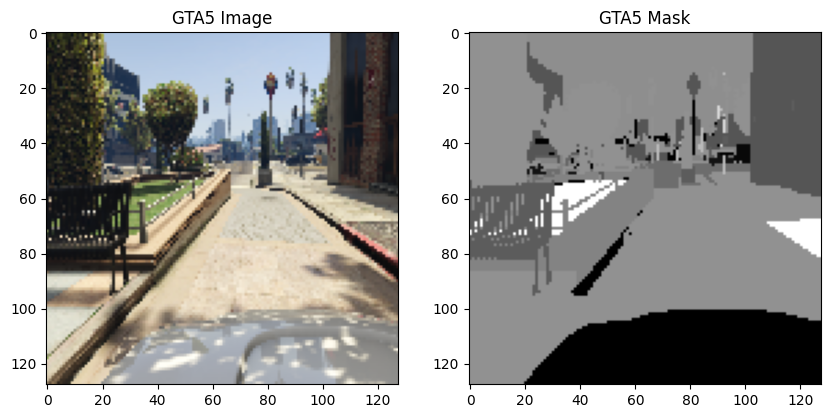

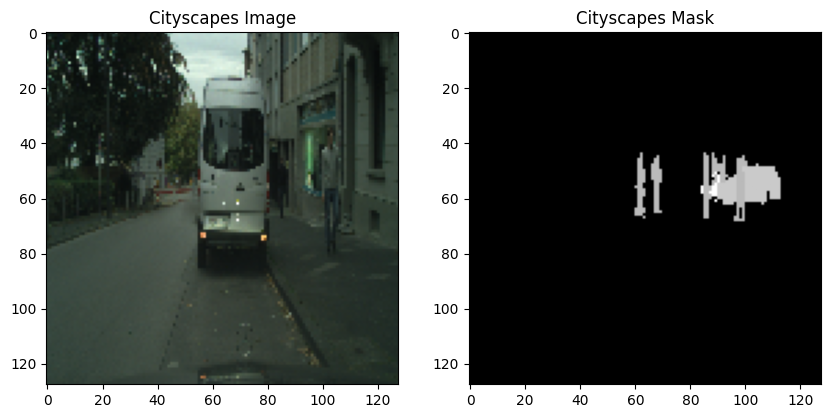

In [8]:

import glob
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Define the paths to the images and labels for the GTA5 dataset
gta5_images_dir = '/content/gta/images/'
gta5_labels_dir = '/content/gta/labels/'

# Define the paths to the images and ground truths for the Cityscapes dataset
cityscapes_images_dir = '/content/Cityscape/leftImg8bit/train/aachen'  # Assuming images are in the 'train' folder
cityscapes_gt_dir = '/content/Cityscape/gtFine/train/aachen'  # Assuming ground truths are in the 'train' folder


def resize_and_normalize(image, mask, img_shape=(128, 128)):
    # Resizing and normalizing the image and mask
    image = tf.image.resize(image, img_shape)
    mask = tf.image.resize(mask, img_shape, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = tf.cast(image, tf.float32) / 255.0
    mask = tf.cast(mask, tf.float32)
    return image, mask

def load_image_and_mask(image_path, mask_path):
    # Load and process image and mask
    image_content = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_content, channels=3)
    mask_content = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask_content, channels=1)
    image, mask = resize_and_normalize(image, mask)
    return image, mask


def load_and_display_images(dataset_dir, label_dir, title):
    # Load and display the first image and mask from the dataset
    image_files = glob.glob(f"{dataset_dir}/*.png")
    label_files = glob.glob(f"{label_dir}/*.png")
    if image_files and label_files:
        image, mask = load_image_and_mask(image_files[0], label_files[0])
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image.numpy())
        plt.title(f"{title} Image")
        plt.subplot(1, 2, 2)
        plt.imshow(tf.squeeze(mask).numpy(), cmap='gray')
        plt.title(f"{title} Mask")
        plt.show()
    else:
        print(f"No files found for {title} dataset. Check your paths and filenames.")

# Display images from GTA5 dataset
load_and_display_images(gta5_images_dir, gta5_labels_dir, "GTA5")

# Display images from Cityscapes dataset
load_and_display_images(cityscapes_images_dir, cityscapes_gt_dir, "Cityscapes")


In [9]:
import glob
import numpy as np
import tensorflow as tf

# Correct paths as provided
gta5_images_dir = '/content/gta/images'
gta5_labels_dir = '/content/gta/labels'


# Gather all image and label paths
# gta5_image_paths = glob.glob(f"{gta5_images_dir}*.png")
# gta5_label_paths = glob.glob(f"{gta5_labels_dir}*.png")
gta5_image_paths = glob.glob(f"{gta5_images_dir}/*.png")
gta5_label_paths = glob.glob(f"{gta5_labels_dir}/*.png")


# Sort the lists
gta5_image_paths.sort()
gta5_label_paths.sort()

# Now take as many labels as there are images
gta5_label_paths = gta5_label_paths[:len(gta5_image_paths)]

# Check if the lengths match now
print(f"After adjustment, number of image paths found: {len(gta5_image_paths)}")
print(f"After adjustment, number of label paths found: {len(gta5_label_paths)}")

# Ensure the paths are sorted so they align
assert len(gta5_image_paths) == len(gta5_label_paths), "The number of images still does not match the number of labels."

# Shuffle and split the dataset into training and validation sets
np.random.seed(42)  # Set the seed for reproducibility
indices = np.arange(len(gta5_image_paths))
np.random.shuffle(indices)

# Shuffle and split the dataset into training and validation sets
np.random.seed(42)  # Set the seed for reproducibility
indices = np.arange(len(gta5_image_paths))
np.random.shuffle(indices)

train_split = 0.8
split_index = int(len(indices) * train_split)
train_indices = indices[:split_index]
val_indices = indices[split_index:]

train_image_paths = [gta5_image_paths[i] for i in train_indices]
train_label_paths = [gta5_label_paths[i] for i in train_indices]
val_image_paths = [gta5_image_paths[i] for i in val_indices]
val_label_paths = [gta5_label_paths[i] for i in val_indices]

def resize_and_normalize(image, mask, img_shape=(128, 128)):
    # Resize images to the specified shape
    image = tf.image.resize(image, img_shape)
    mask = tf.image.resize(mask, img_shape, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    image = tf.cast(image, tf.float32) / 255.0

    mask = tf.cast(mask, tf.float32) / 255.0

    return image, mask

def load_image_and_mask(image_path, mask_path, img_shape=(128, 128)):
    # Load the raw data from the file as a string
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)

    image, mask = resize_and_normalize(image, mask, img_shape)

    return image, mask

def augment(image, mask):
    image, mask = tf.image.random_flip_left_right(image), tf.image.random_flip_left_right(mask)
    image, mask = tf.image.random_flip_up_down(image), tf.image.random_flip_up_down(mask)
    angle = tf.random.uniform(shape=[], minval=-0.2, maxval=0.2)
    image, mask = tf.image.rot90(image, k=int(angle * 2 * np.pi)), tf.image.rot90(mask, k=int(angle * 2 * np.pi))
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)
    image = tf.clip_by_value(image, 0, 1)

    return image, mask


def prepare_dataset(image_paths, label_paths, batch_size, apply_augmentation=False):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_paths))

    def _load_and_preprocess(image_path, label_path):
        image, mask = load_image_and_mask(image_path, label_path)
        return augment(image, mask) if apply_augmentation else (image, mask)

    dataset = dataset.map(_load_and_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # The shuffle buffer size should be greater than or equal to the size of the dataset
    return dataset.shuffle(buffer_size=len(image_paths)).batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

print([type(p) for p in train_image_paths[:5]])
print([type(p) for p in train_label_paths[:5]])
assert len(train_image_paths) == len(train_label_paths), "Mismatch in the number of images and labels."


# Create the datasets
batch_size = 8
train_dataset = prepare_dataset(train_image_paths, train_label_paths, batch_size, apply_augmentation=True)
val_dataset = prepare_dataset(val_image_paths, val_label_paths, batch_size, apply_augmentation=False)


# # Inspect a batch from the training dataset
# for images, masks in train_dataset.take(1):
#     print("Batch image shape:", images.shape)
#     print("Batch mask shape:", masks.shape)

# Now you can use `train_dataset` and `val_dataset` for training and validation
# Assuming the paths for Cityscapes test images and labels are set
cityscapes_test_images_dir = '/content/Cityscape/leftImg8bit/test'  # Update with the correct path
cityscapes_test_labels_dir = '/content/Cityscape/gtFine/test'  # Update with the correct path

# Gather all test image and label paths from Cityscapes
cityscapes_test_image_paths = glob.glob(f"{cityscapes_test_images_dir}/**/*.png", recursive=True)
cityscapes_test_label_paths = glob.glob(f"{cityscapes_test_labels_dir}/**/*.png", recursive=True)

cityscapes_test_label_paths = [path for path in cityscapes_test_label_paths if 'labelId' in path]
assert len(cityscapes_test_image_paths) == len(cityscapes_test_label_paths), "Counts do not match after filtering."
cityscapes_test_image_paths.sort()
cityscapes_test_label_paths.sort()
# Create the test dataset
test_dataset = prepare_dataset(cityscapes_test_image_paths, cityscapes_test_label_paths, batch_size=8)


# Print the number of paths found for images and labels
print(f"Number of Cityscapes test images found: {len(cityscapes_test_image_paths)}")
print(f"Number of Cityscapes test labels found: {len(cityscapes_test_label_paths)}")



After adjustment, number of image paths found: 24966
After adjustment, number of label paths found: 24966
[<class 'str'>, <class 'str'>, <class 'str'>, <class 'str'>, <class 'str'>]
[<class 'str'>, <class 'str'>, <class 'str'>, <class 'str'>, <class 'str'>]
Number of Cityscapes test images found: 1525
Number of Cityscapes test labels found: 1525


In [27]:
import tensorflow as tf

if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")


Default GPU Device: /device:GPU:0


In [28]:
import keras_tuner as kt

def model_builder(hp):
    # Hyperparameters to tune
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    hp_dropout_rate = hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1)
    # Add more hyperparameters as needed, for example:
    # hp_units = hp.Int('units', min_value=32, max_value=512, step=32)

    # Build the U-Net model with named dropout using the hyperparameters
    model = build_unet_model_with_named_dropout(dropout_rate=hp_dropout_rate)

    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])

    return model



In [10]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Build the U-Net model
unet_model = build_unet_model_with_named_dropout()

# Define an ExponentialDecay learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

# Compile the model with the Adam optimizer using the learning rate schedule
unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),  # Use the learning rate schedule
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

# Define EarlyStopping and ReduceLROnPlateau callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1,
    restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    verbose=1)

# Define the number of epochs to train for and the batch size
NUM_EPOCHS = 20
BATCH_SIZE = 32

# Specify the number of sample batches to take from the training and validation datasets
SAMPLE_BATCHES = 57

# Take a sample of the training and validation datasets
sample_train_dataset = train_dataset.take(SAMPLE_BATCHES)
sample_val_dataset = val_dataset.take(SAMPLE_BATCHES)

# Fit the model using the sampled training and validation datasets
model_history = unet_model.fit(
    sample_train_dataset,
    epochs=NUM_EPOCHS,
    validation_data=sample_val_dataset,
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/20
57/57 [==============================] - 382s 1s/step - loss: 4.4044 - accuracy: 0.1964 - val_loss: 0.2457 - val_accuracy: 0.1962 - lr: 0.0010
Epoch 2/20
57/57 [==============================] - 385s 1s/step - loss: 0.2440 - accuracy: 0.2006 - val_loss: 0.2246 - val_accuracy: 0.1972 - lr: 0.0010
Epoch 3/20
57/57 [==============================] - 386s 1s/step - loss: 0.2378 - accuracy: 0.2144 - val_loss: 0.2183 - val_accuracy: 0.2006 - lr: 0.0010
Epoch 4/20
57/57 [==============================] - 371s 1s/step - loss: 0.2304 - accuracy: 0.2002 - val_loss: 0.2214 - val_accuracy: 0.2106 - lr: 0.0010
Epoch 5/20
57/57 [==============================] - 367s 1s/step - loss: 0.2210 - accuracy: 0.2066 - val_loss: 0.2360 - val_accuracy: 0.2069 - lr: 0.0010
Epoch 6/20
57/57 [==============================] - 378s 1s/step - loss: 0.2096 - accuracy: 0.1937 - val_loss: 0.2195 - val_accuracy: 0.1958 - lr: 0.0010
Epoch 7/20
57/57 [==============================] - 363s 1s/step - loss: 0.2

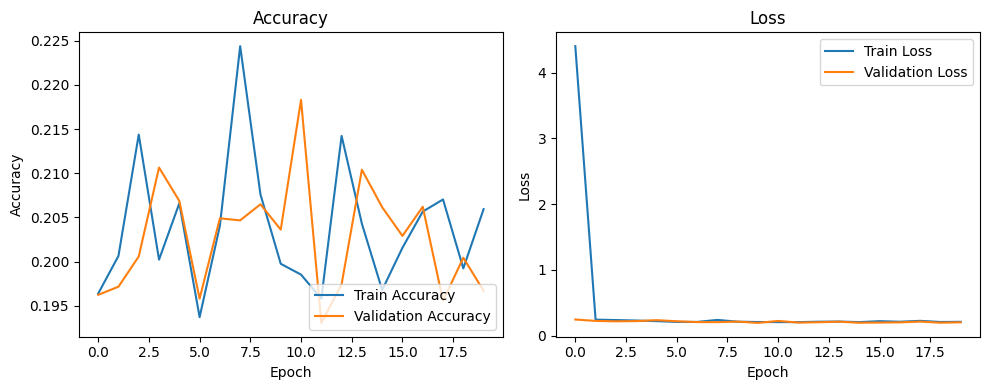

In [11]:
def display_learning_curves(history):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]

    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

    epochs_range = range(NUM_EPOCHS)

    fig = plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label="Train Accuracy")
    plt.plot(epochs_range, val_acc, label="Validation Accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label="Train Loss")
    plt.plot(epochs_range, val_loss, label="Validation Loss")
    plt.title("Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")

    fig.tight_layout()
    plt.show()

# Call the function to display the learning curves
display_learning_curves(model_history)

In [12]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[0]
    return pred_mask[..., tf.newaxis]

def save_predicted_images(dataset, model, num=1, save_dir='predictions'):
    # Ensure the save directory exists
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    for i, (image, true_mask) in enumerate(dataset.take(num)):
        # Generate predictions
        pred_mask = model.predict(image)
        pred_mask = create_mask(pred_mask)

        # Convert prediction to a 2D array
        pred_mask_image = pred_mask.numpy().astype(np.uint8)

        # Save the predicted mask image
        save_path = os.path.join(save_dir, f"predicted_mask_{i+1}.png")
        Image.fromarray(pred_mask_image).save(save_path)
        print(f"Saved predicted mask to {save_path}")

        # Optionally, display the images
        display([image[0], true_mask[0], pred_mask])


1/1 [==============================] - 0s 371ms/step


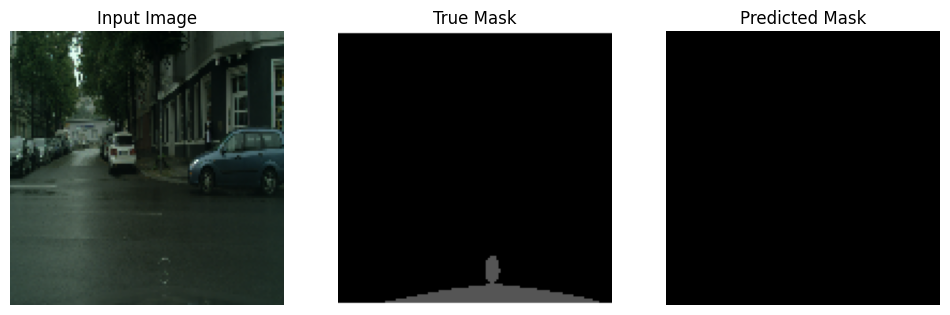

In [13]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = tf.expand_dims(pred_mask, axis=-1)  # Ensure we have a last dimension for channels
    return pred_mask

def display(display_list):
    plt.figure(figsize=(12, 4))  # Adjust the figure size to fit the three images
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])

        # If the display item is a mask, ensure it has 3 channels
        img = display_list[i]
        if len(img.shape) == 2:  # If the mask is 2D, expand it to 3D.
            img = np.expand_dims(img, axis=-1)
        if img.shape[-1] == 1:  # If there's only one channel, repeat it to simulate RGB.
            img = np.concatenate([img] * 3, axis=-1)

        plt.imshow(tf.keras.preprocessing.image.array_to_img(img))
        plt.axis('off')
    plt.show()

def show_predictions(dataset, model, num=1):
    # Take one sample from the dataset
    for images, masks in dataset.take(num):
        preds = model.predict(images)
        display_list = [
            images[0].numpy(),  # Convert the first tensor to a numpy array
            masks[0].numpy(),
            create_mask(preds[0]).numpy()  # Convert the first prediction to a numpy array
        ]
        display(display_list)

# Assuming test_dataset is a tf.data.Dataset object and unet_model is your trained model
show_predictions(test_dataset, unet_model, num=1)


In [24]:
# SAVE MASKED IMAGES
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Define the create_mask function
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = tf.expand_dims(pred_mask, axis=-1)  # Ensure we have a last dimension for channels
    return pred_mask

# Updated display function to handle only the predicted mask
def display_mask(mask, save_path):
    plt.figure(figsize=(4, 4))  # Adjust the figure size for the single image
    plt.title('Predicted Mask')

    # Ensure the mask has 3 channels for display
    if mask.shape[-1] == 1:  # If there's only one channel, repeat it to simulate RGB.
        mask = np.concatenate([mask] * 3, axis=-1)

    plt.imshow(tf.keras.preprocessing.image.array_to_img(mask))
    plt.axis('off')
    plt.savefig(save_path)  # Save the figure
    plt.close()  # Close the figure to avoid displaying it

# Updated show_predictions function to save only predicted mask images
def show_predictions(dataset, model, num=1, save_dir='/content/drive/MyDrive/Colab Notebooks/kaggle_API_credentials/prediction_2_a/'):
    os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
    for idx, (images, _) in enumerate(dataset.take(num)):
        preds = model.predict(images)
        predicted_mask = create_mask(preds[0]).numpy()  # Convert the first prediction to a numpy array
        save_path = os.path.join(save_dir, f'predicted_mask_{idx}.png')
        display_mask(predicted_mask, save_path)

# Usage Example
# Assuming `test_dataset` is your dataset and `unet_model` is your trained model
show_predictions(test_dataset, unet_model, num=1000)


1/1 [==============================] - 1s 825ms/step


1/1 [==============================] - 0s 21ms/step


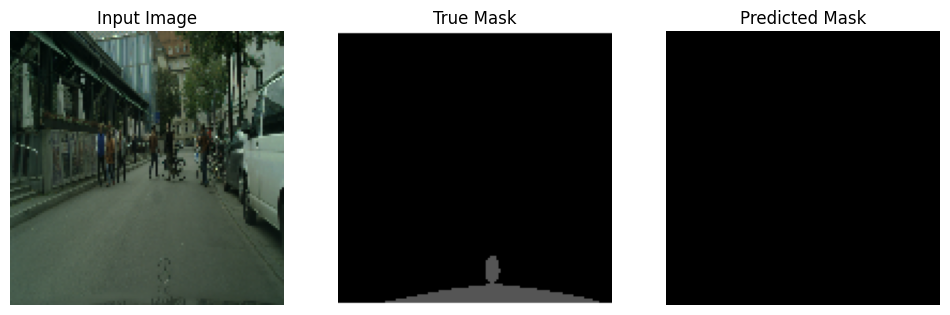

1/1 [==============================] - 0s 20ms/step


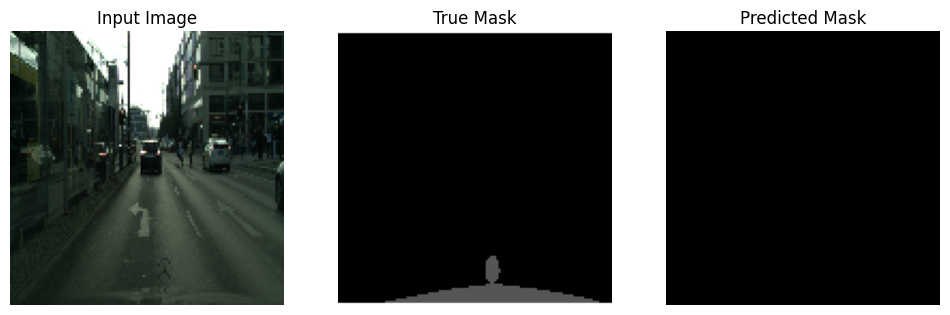

1/1 [==============================] - 0s 20ms/step


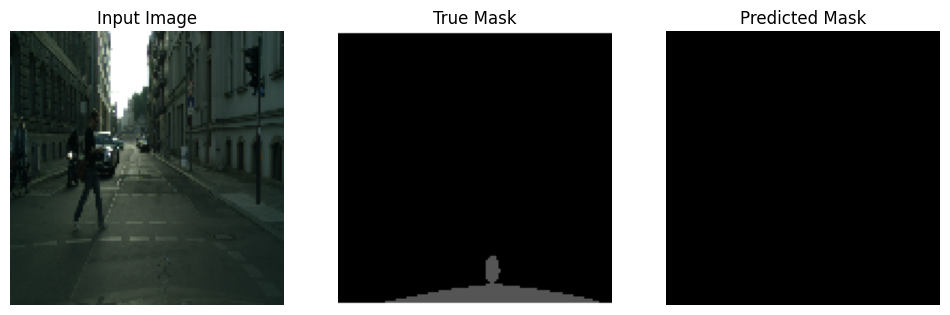

1/1 [==============================] - 0s 22ms/step


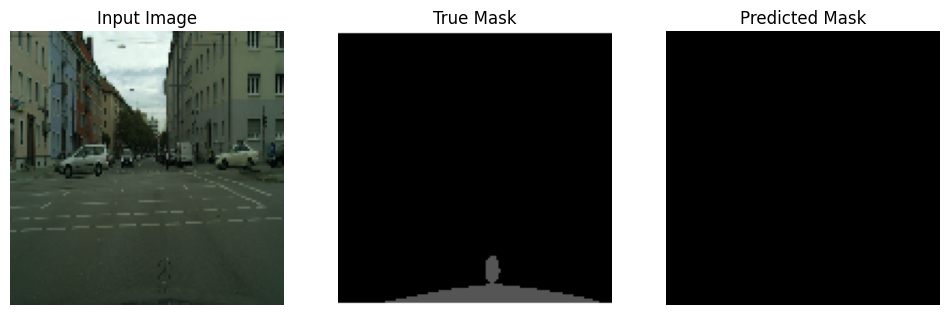

1/1 [==============================] - 0s 19ms/step


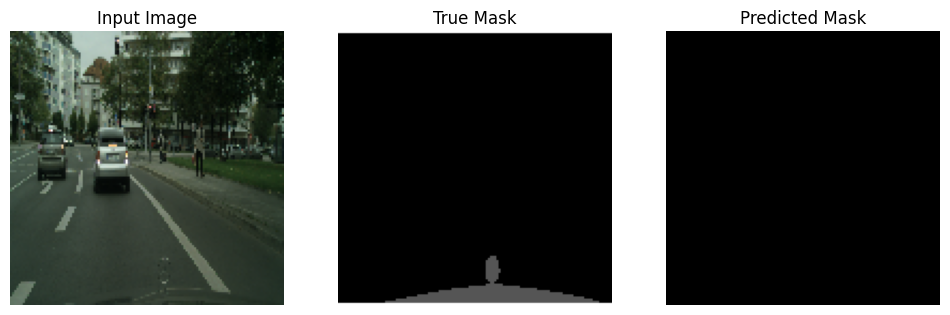

1/1 [==============================] - 0s 19ms/step


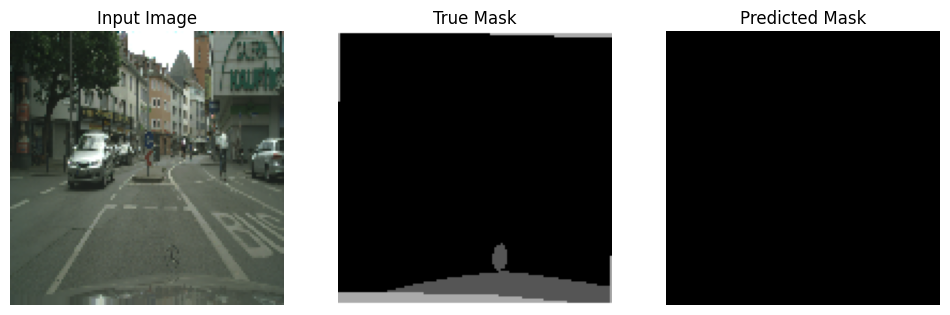

1/1 [==============================] - 0s 22ms/step


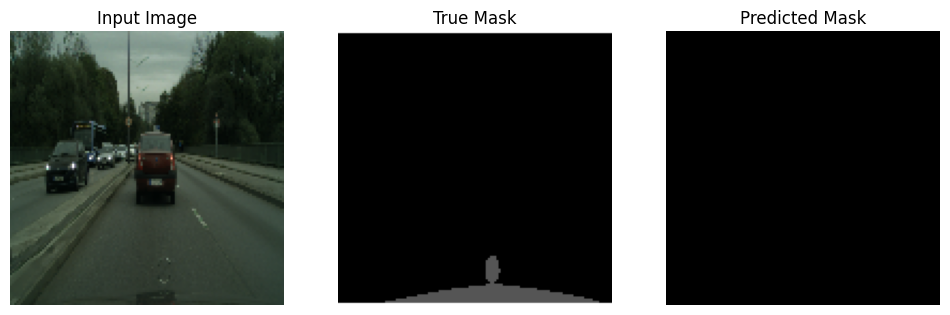

1/1 [==============================] - 0s 23ms/step


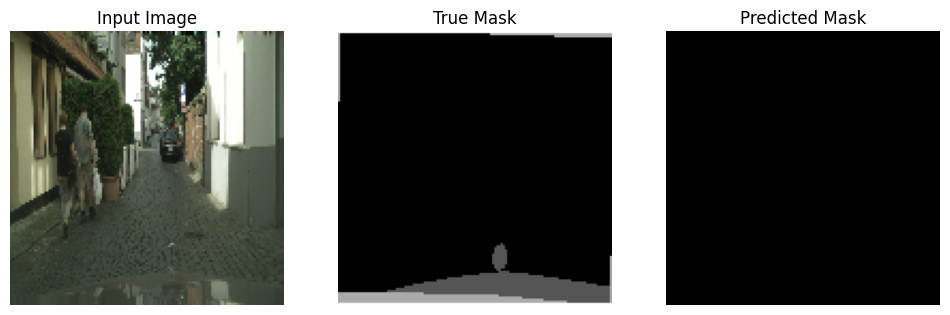

1/1 [==============================] - 0s 21ms/step


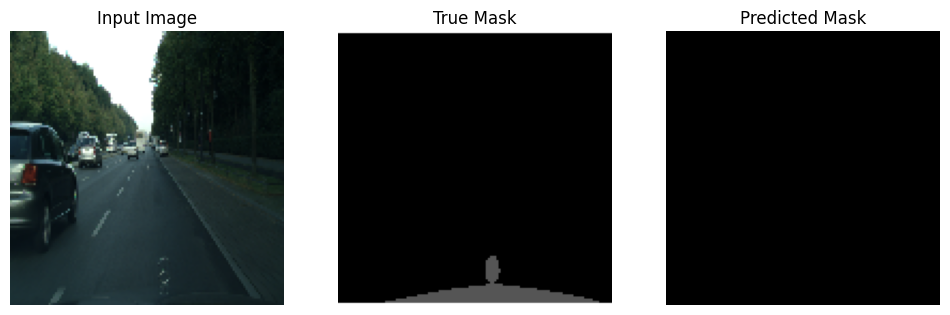

1/1 [==============================] - 0s 20ms/step


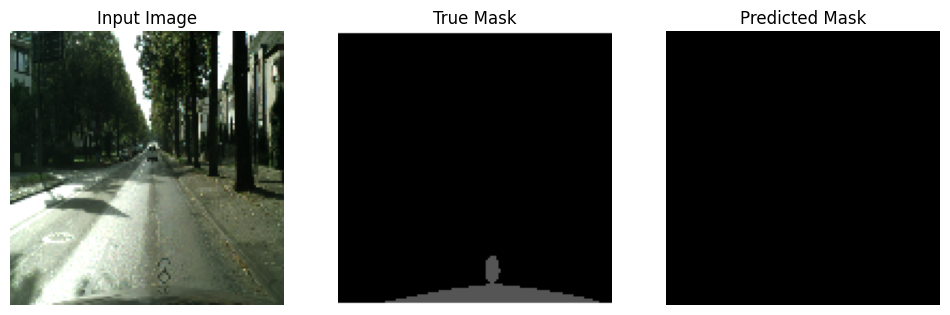

1/1 [==============================] - 0s 21ms/step


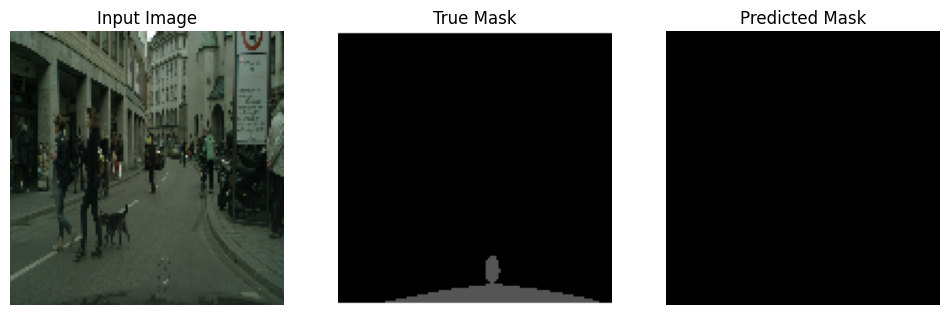

1/1 [==============================] - 0s 21ms/step


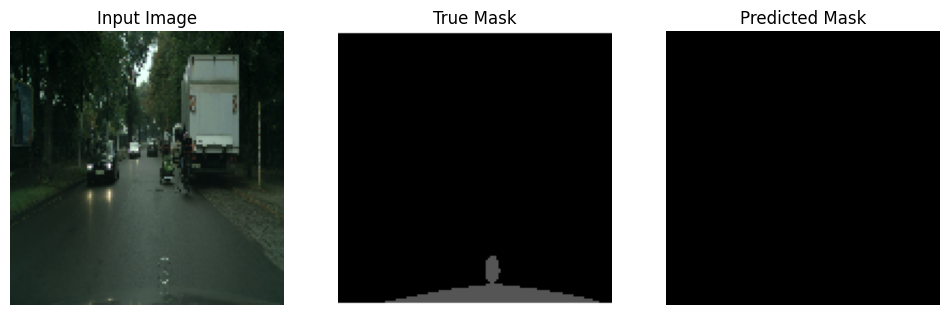

1/1 [==============================] - 0s 65ms/step


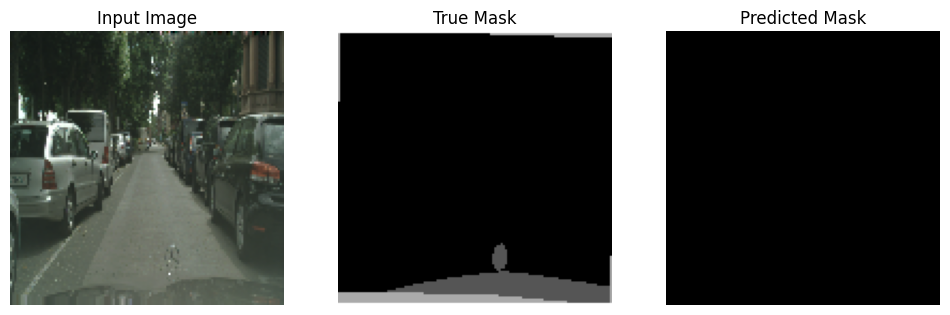

1/1 [==============================] - 0s 21ms/step


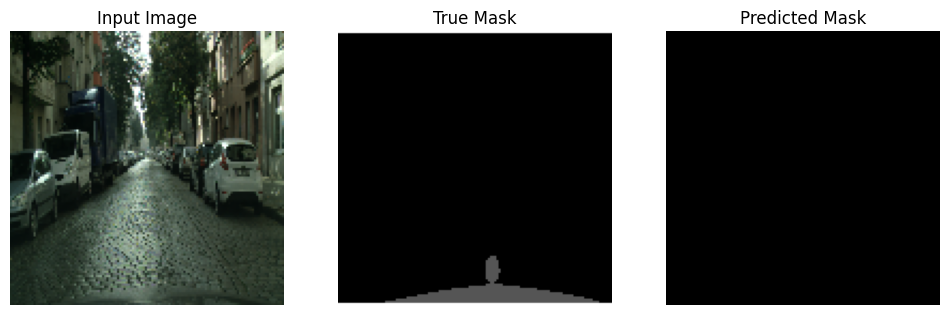

1/1 [==============================] - 0s 22ms/step


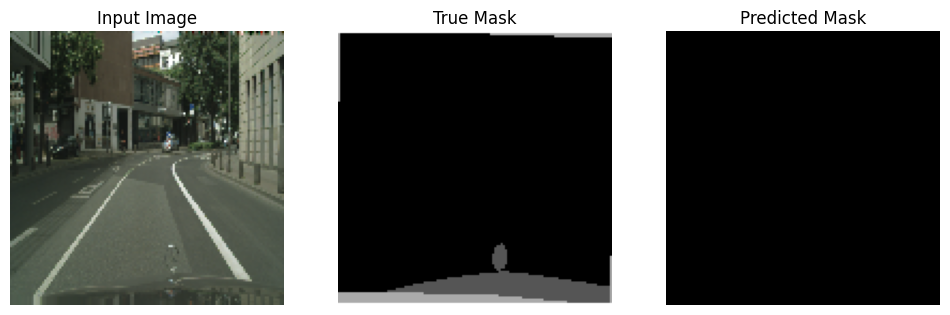

1/1 [==============================] - 0s 20ms/step


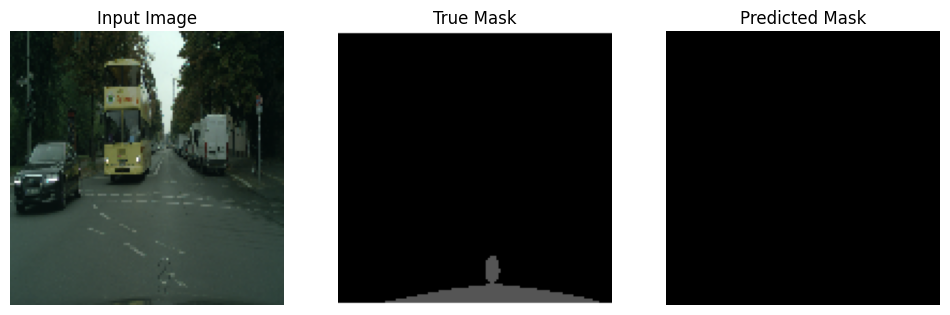

1/1 [==============================] - 0s 20ms/step


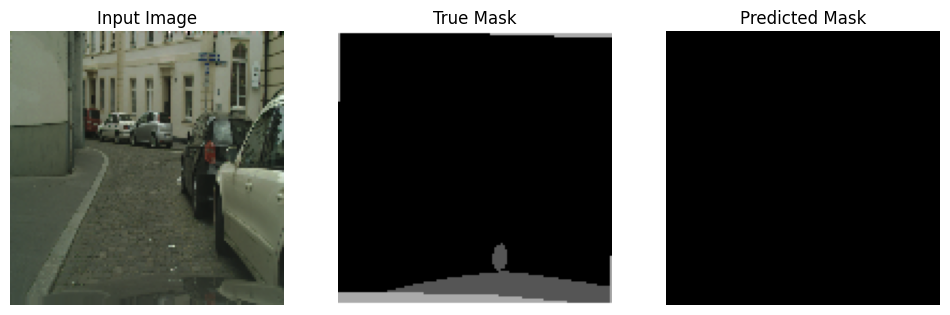

1/1 [==============================] - 0s 21ms/step


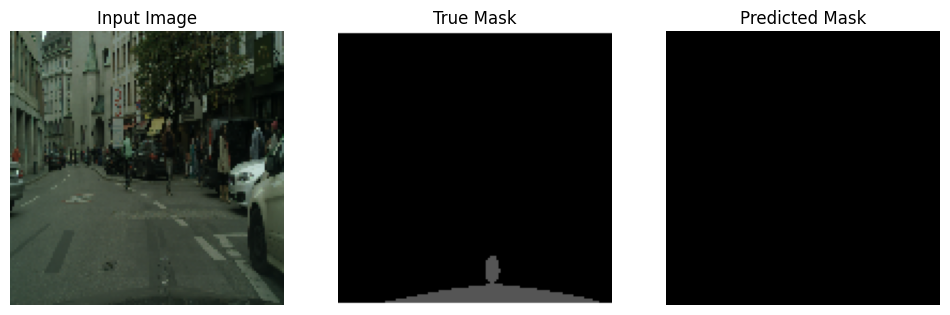

1/1 [==============================] - 0s 25ms/step


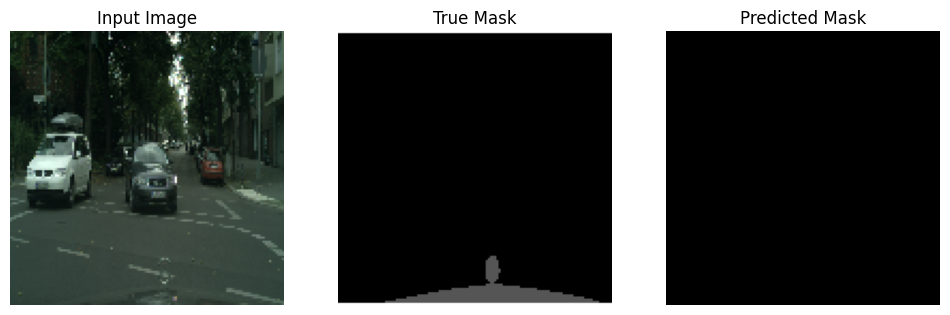

1/1 [==============================] - 0s 20ms/step


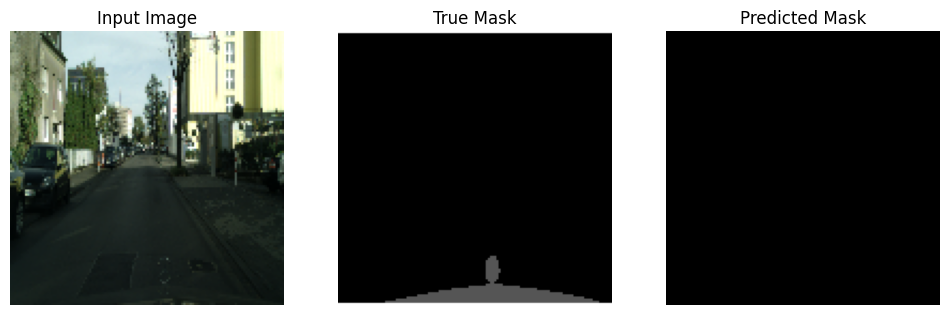

1/1 [==============================] - 0s 20ms/step


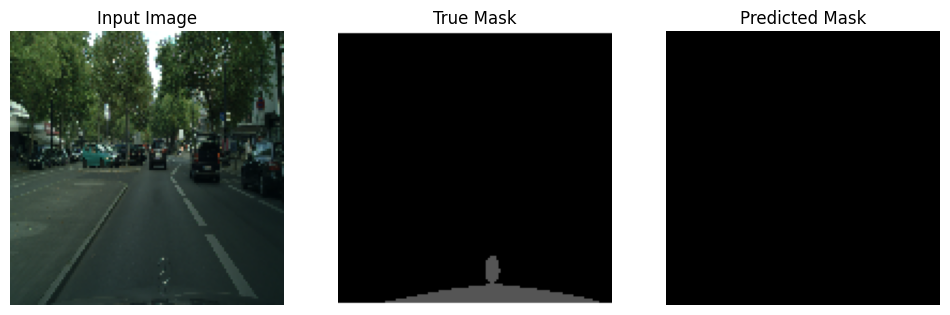

1/1 [==============================] - 0s 21ms/step


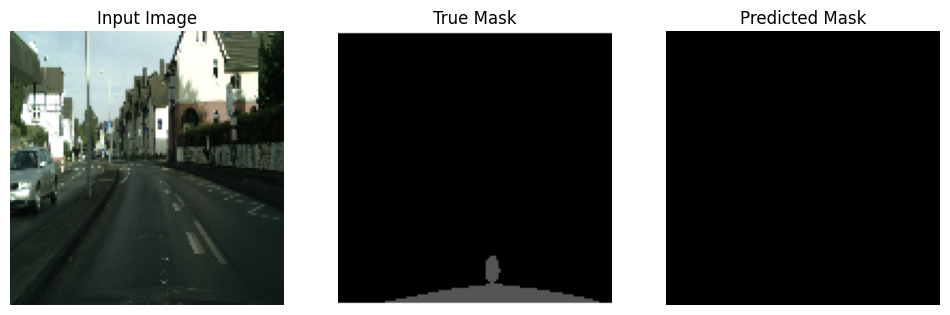

1/1 [==============================] - 0s 23ms/step


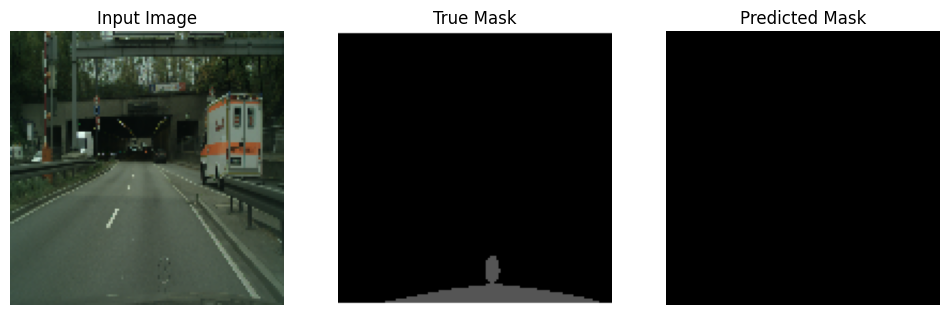

1/1 [==============================] - 0s 23ms/step


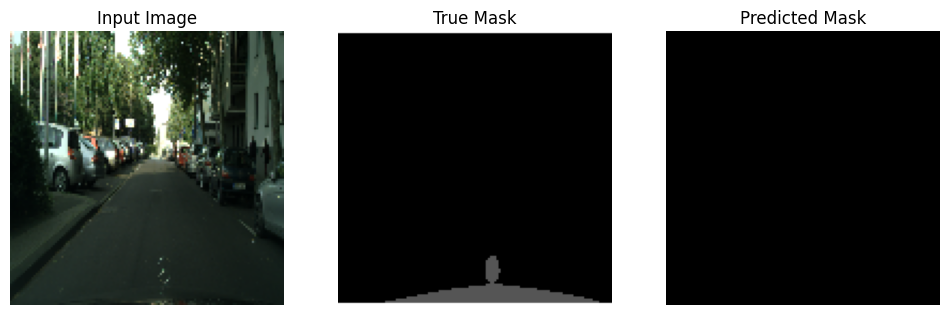

1/1 [==============================] - 0s 22ms/step


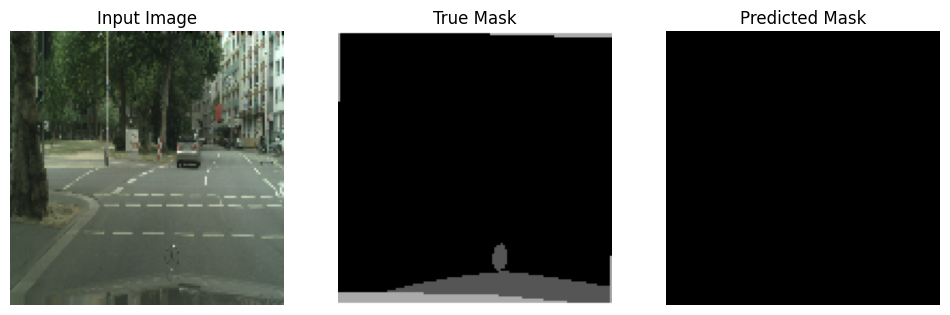

1/1 [==============================] - 0s 24ms/step


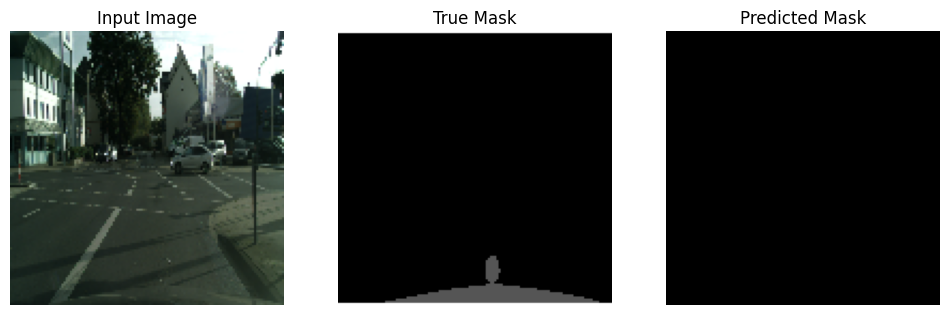

1/1 [==============================] - 0s 21ms/step


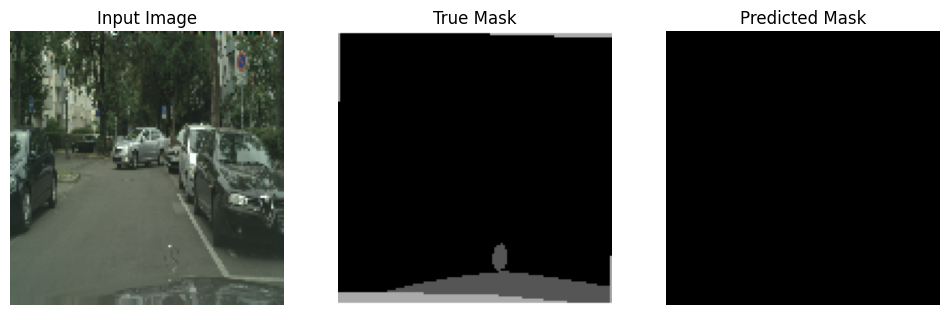

1/1 [==============================] - 0s 20ms/step


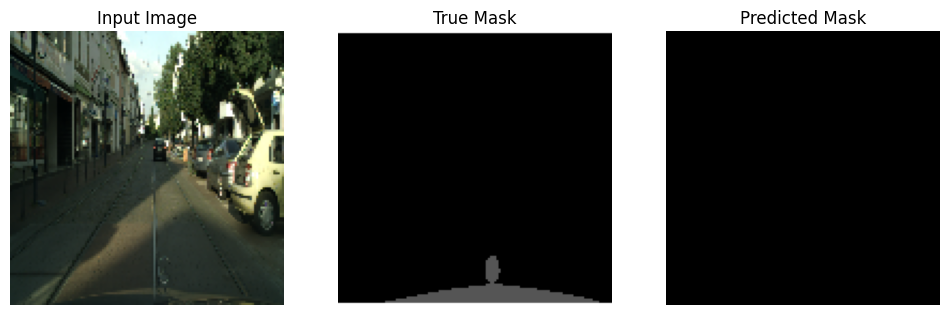

1/1 [==============================] - 0s 21ms/step


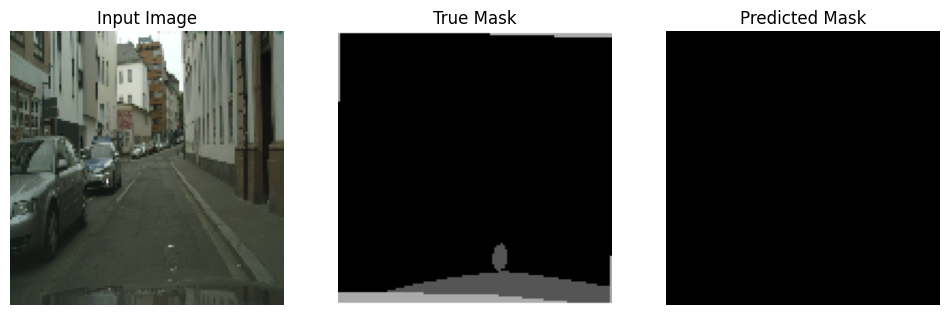

1/1 [==============================] - 0s 22ms/step


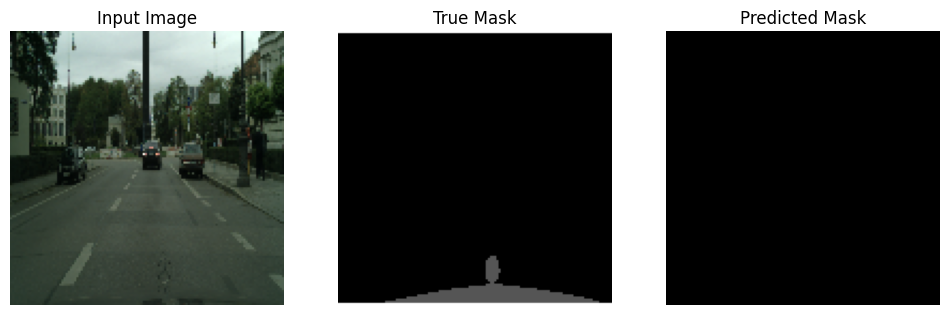

1/1 [==============================] - 0s 25ms/step


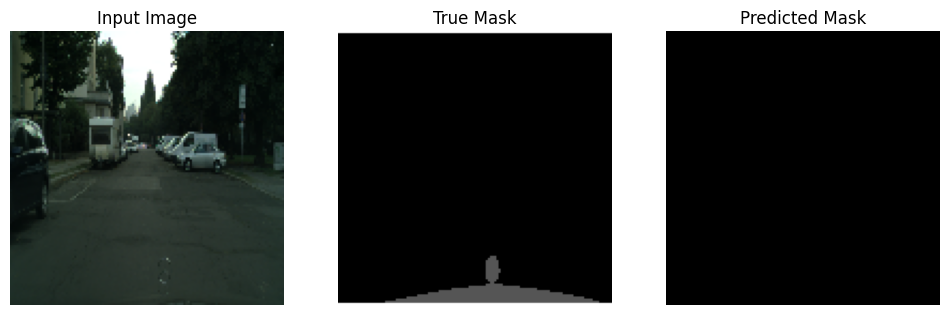

1/1 [==============================] - 0s 22ms/step


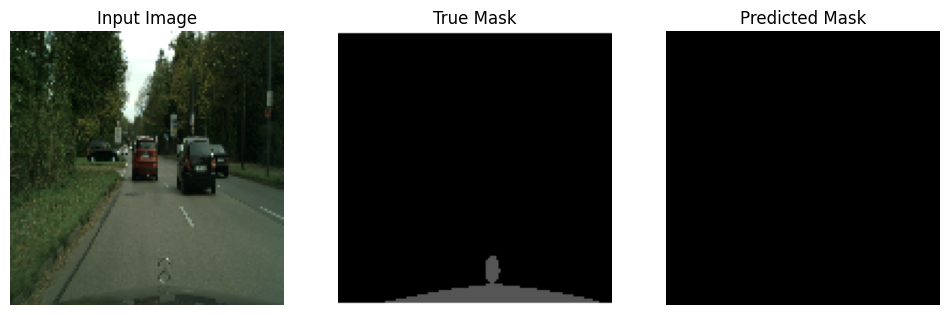

1/1 [==============================] - 0s 21ms/step


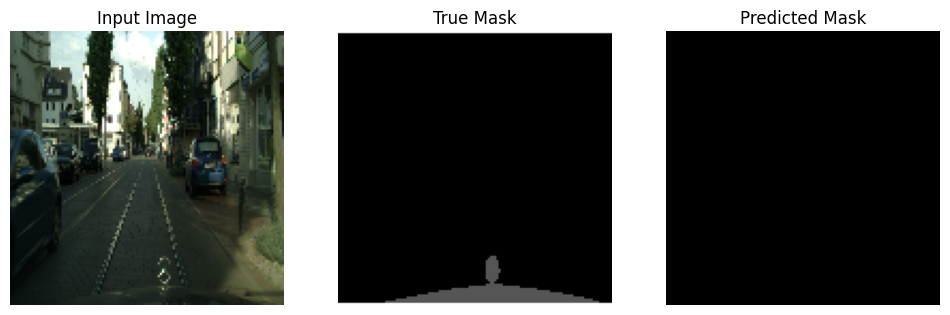

1/1 [==============================] - 0s 21ms/step


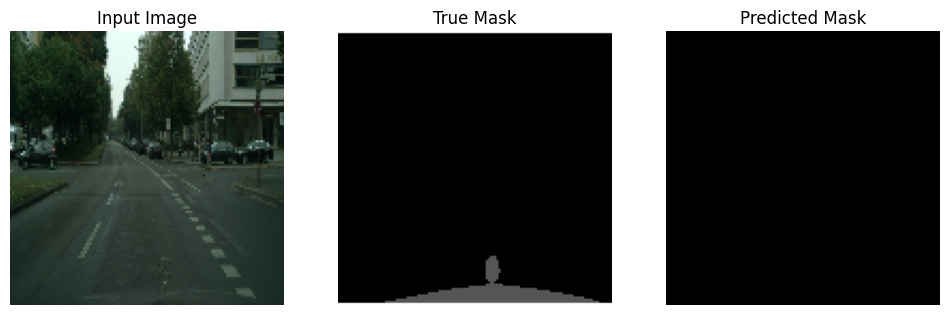

1/1 [==============================] - 0s 22ms/step


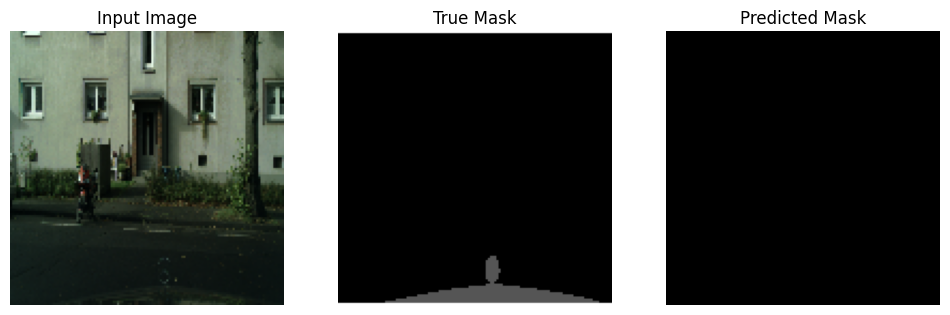

1/1 [==============================] - 0s 22ms/step


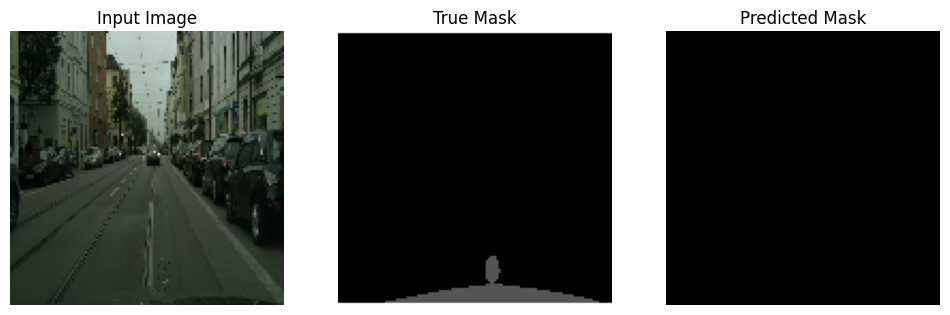

1/1 [==============================] - 0s 22ms/step


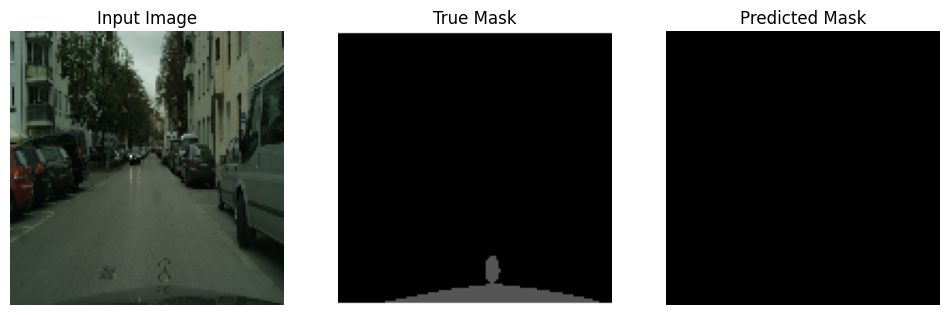

1/1 [==============================] - 0s 20ms/step


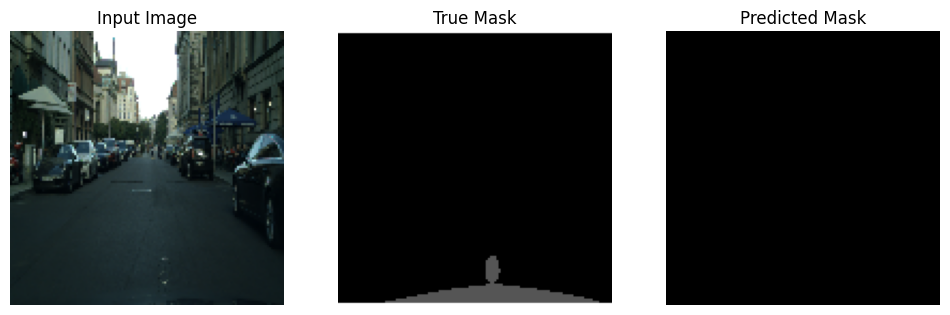

1/1 [==============================] - 0s 20ms/step


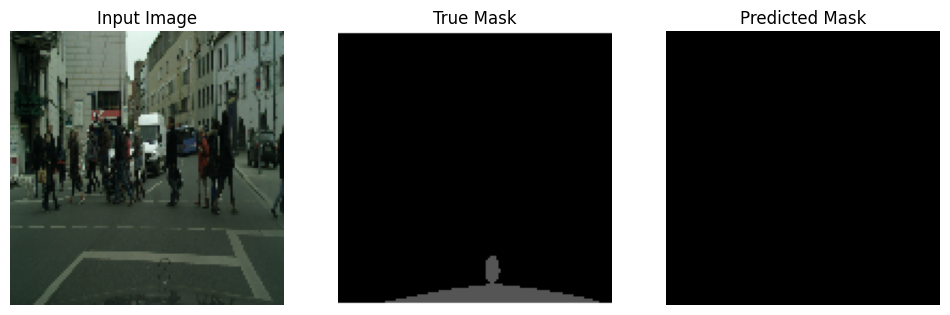

1/1 [==============================] - 0s 20ms/step


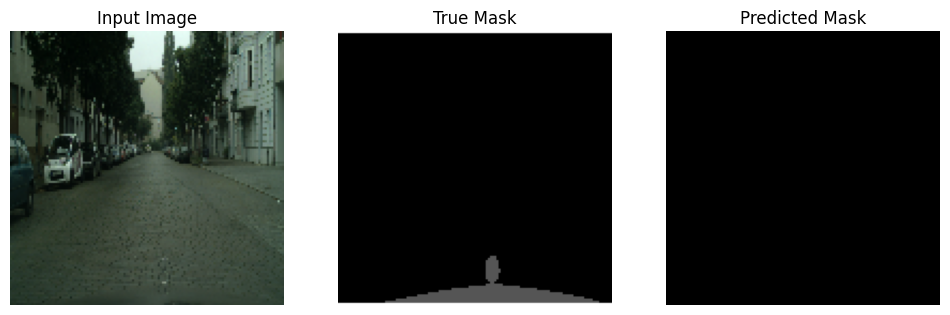

1/1 [==============================] - 0s 21ms/step


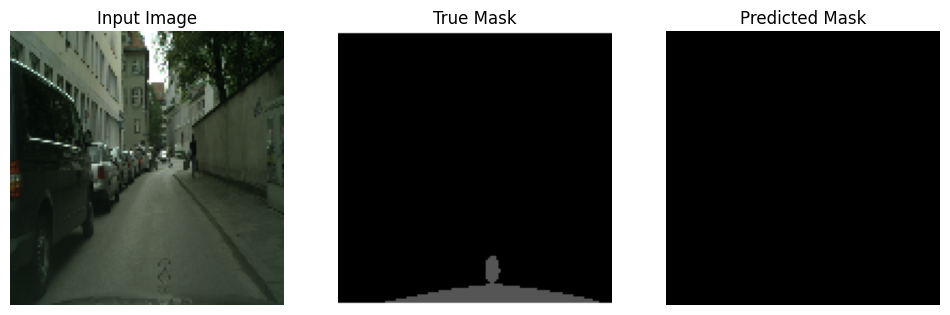

1/1 [==============================] - 0s 20ms/step


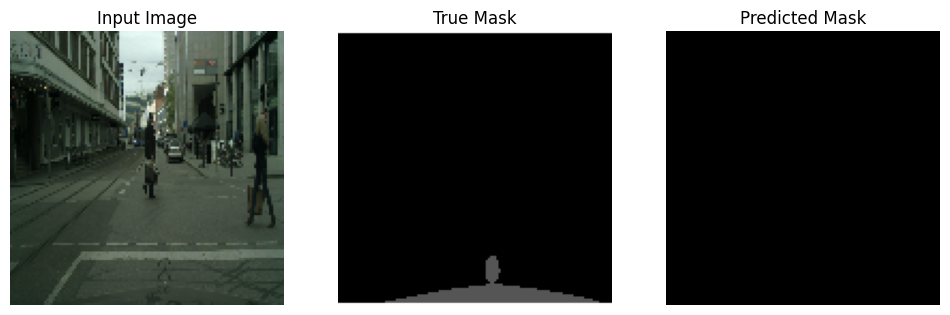

1/1 [==============================] - 0s 19ms/step


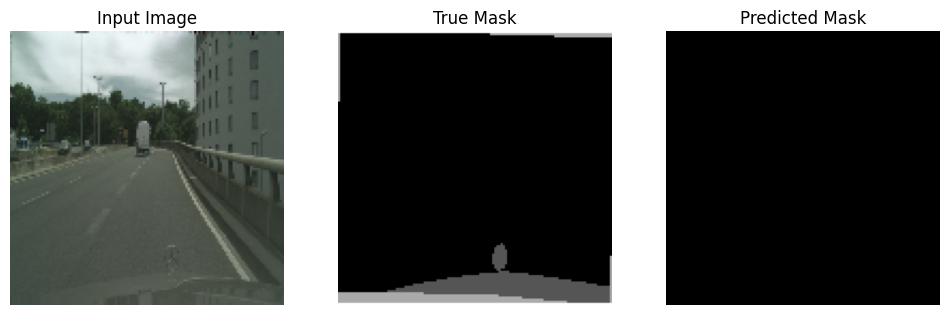

1/1 [==============================] - 0s 19ms/step


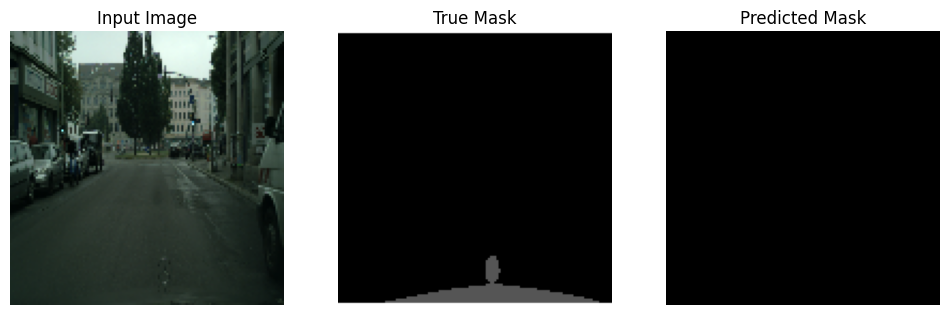

1/1 [==============================] - 0s 20ms/step


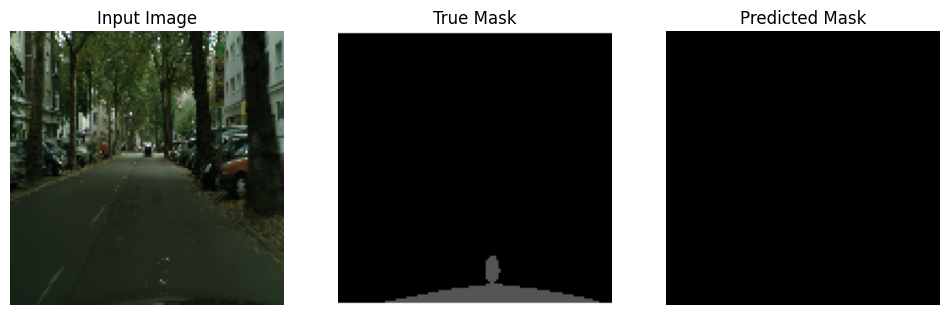

1/1 [==============================] - 0s 20ms/step


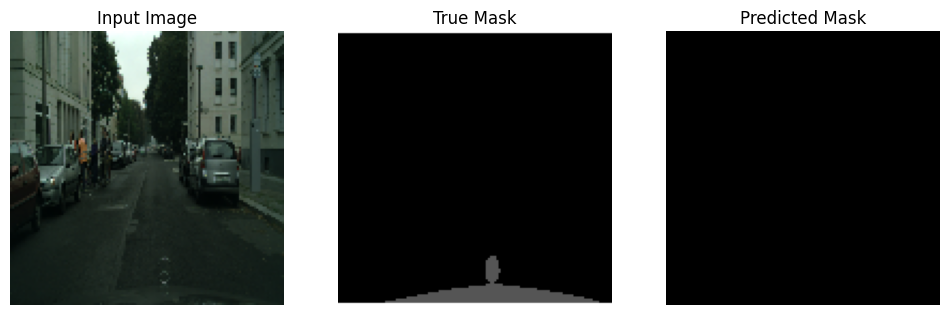

1/1 [==============================] - 0s 19ms/step


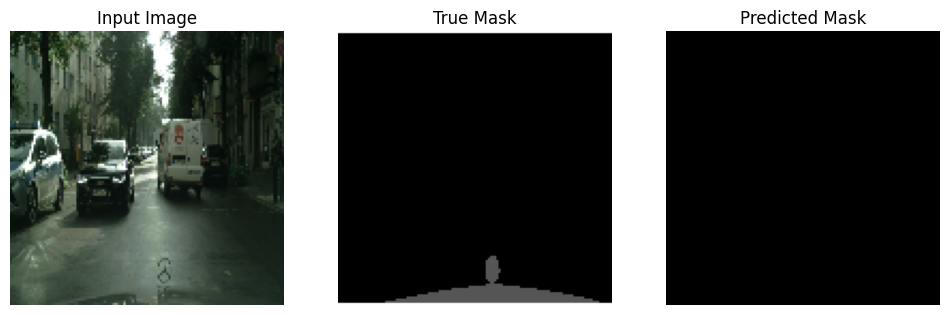

1/1 [==============================] - 0s 26ms/step


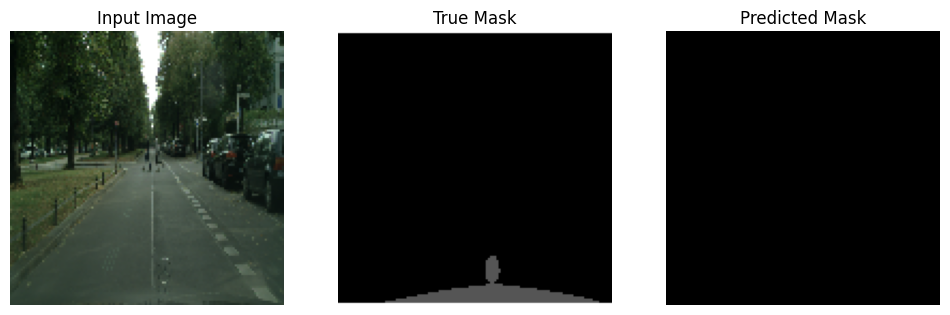

1/1 [==============================] - 0s 19ms/step


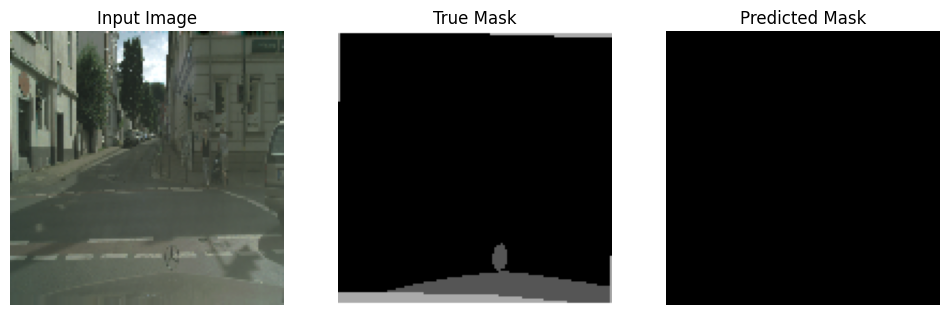

1/1 [==============================] - 0s 19ms/step


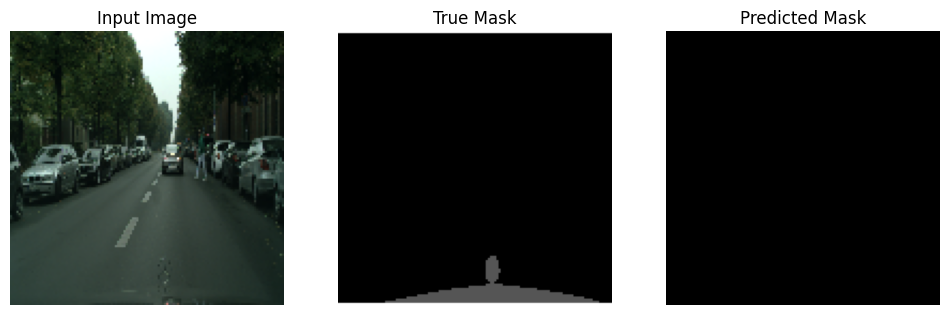

1/1 [==============================] - 0s 20ms/step


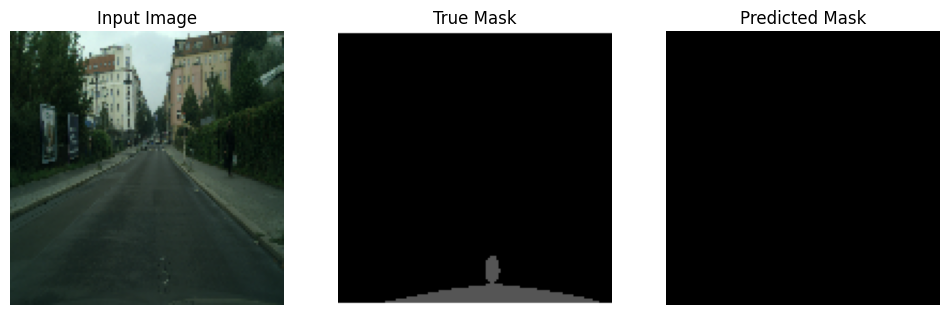

1/1 [==============================] - 0s 20ms/step


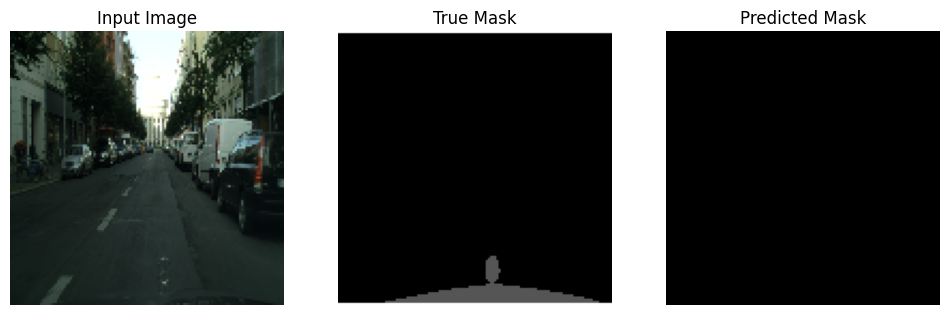

1/1 [==============================] - 0s 21ms/step


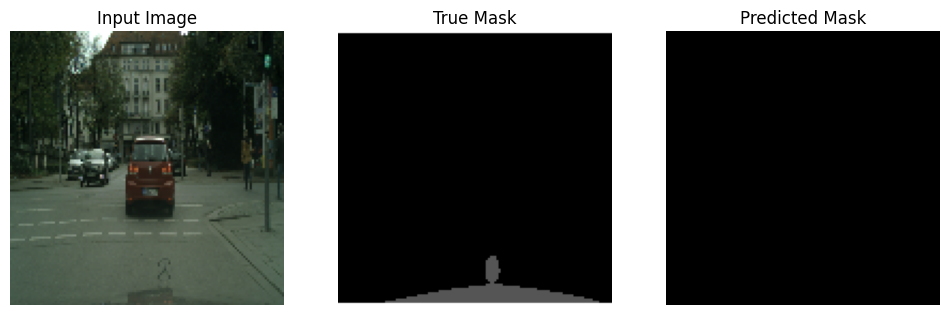

1/1 [==============================] - 0s 21ms/step


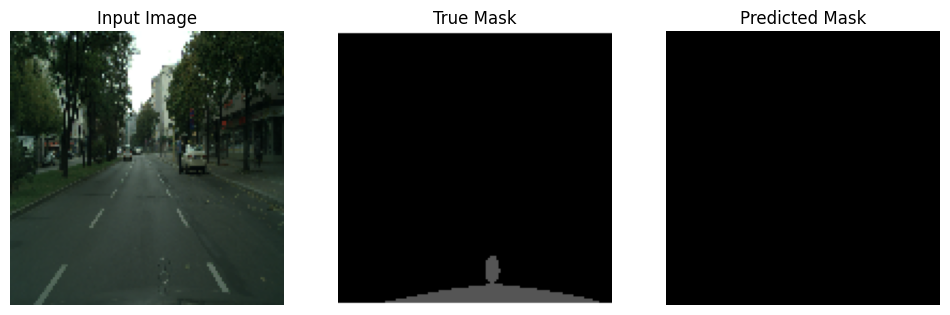

1/1 [==============================] - 0s 21ms/step


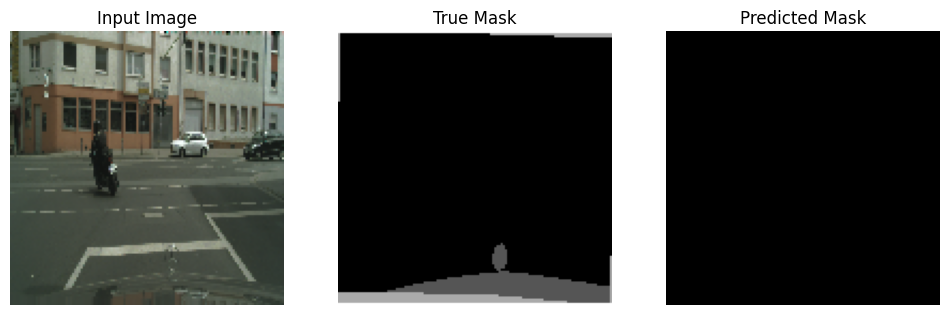

1/1 [==============================] - 0s 21ms/step


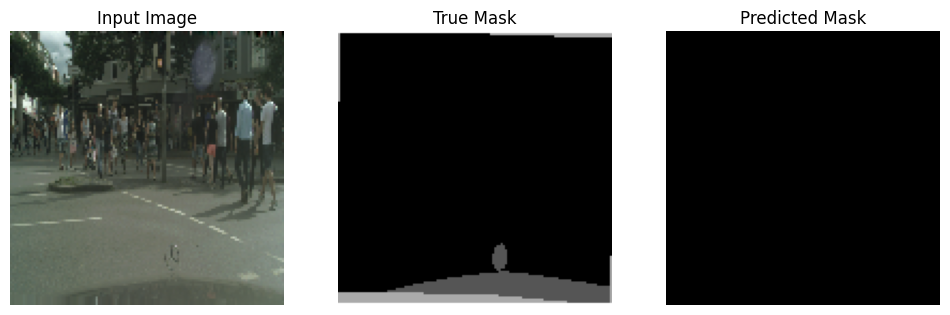

1/1 [==============================] - 0s 21ms/step


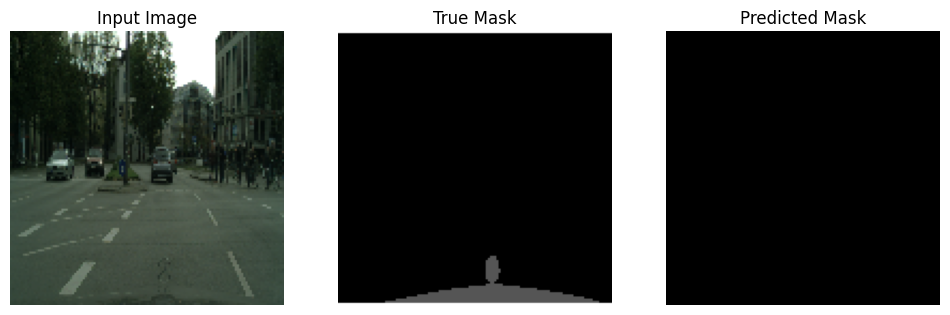

1/1 [==============================] - 0s 22ms/step


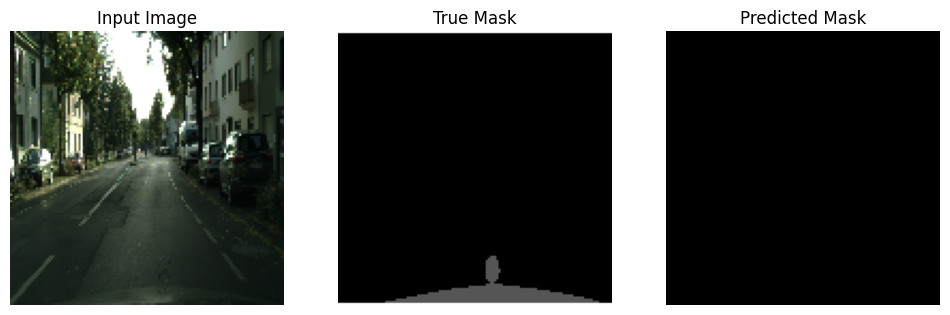

1/1 [==============================] - 0s 21ms/step


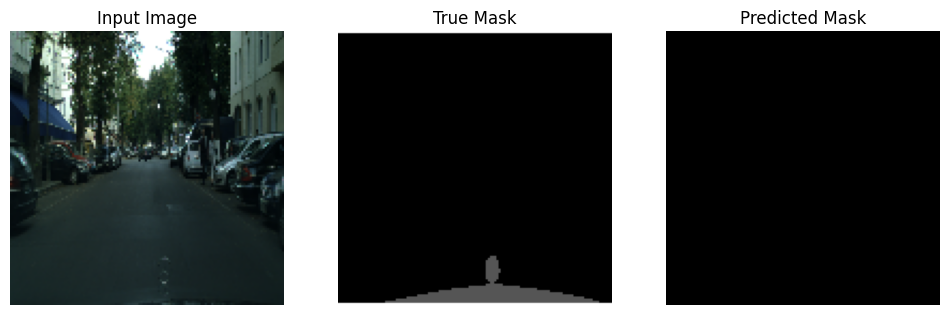

1/1 [==============================] - 0s 23ms/step


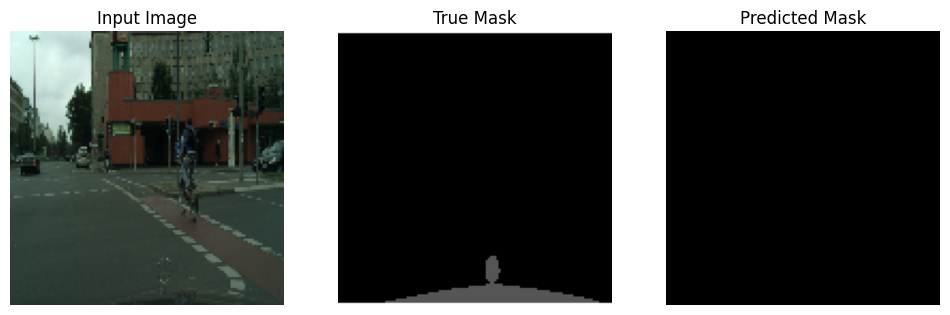

1/1 [==============================] - 0s 23ms/step


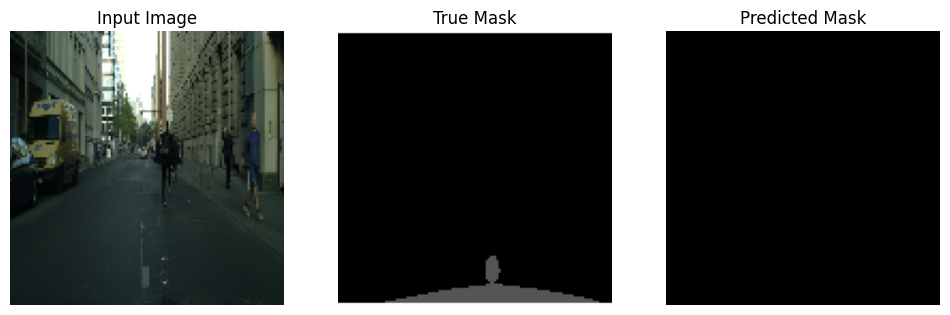

1/1 [==============================] - 0s 22ms/step


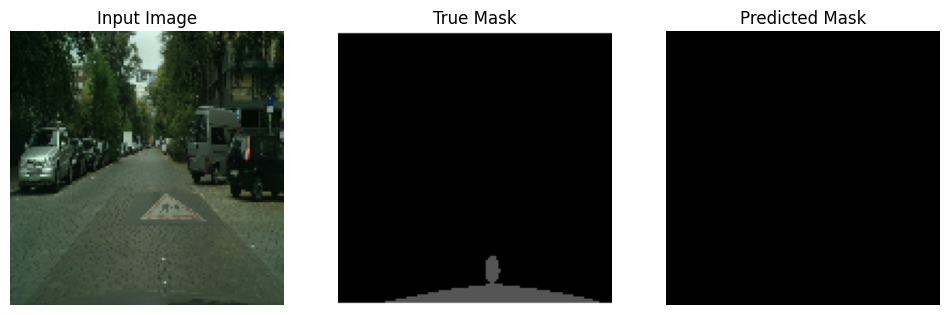

1/1 [==============================] - 0s 21ms/step


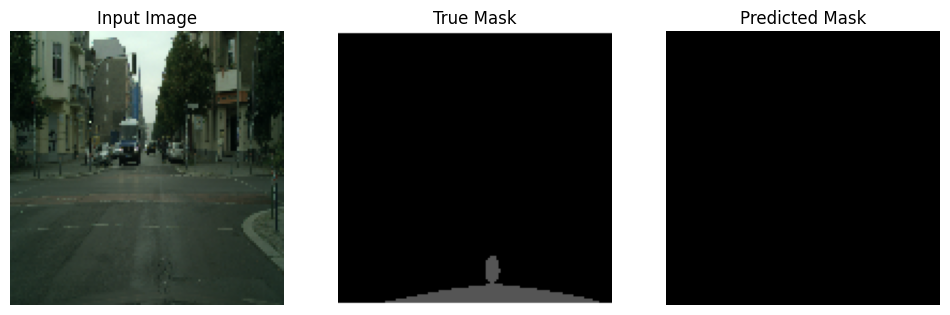

1/1 [==============================] - 0s 21ms/step


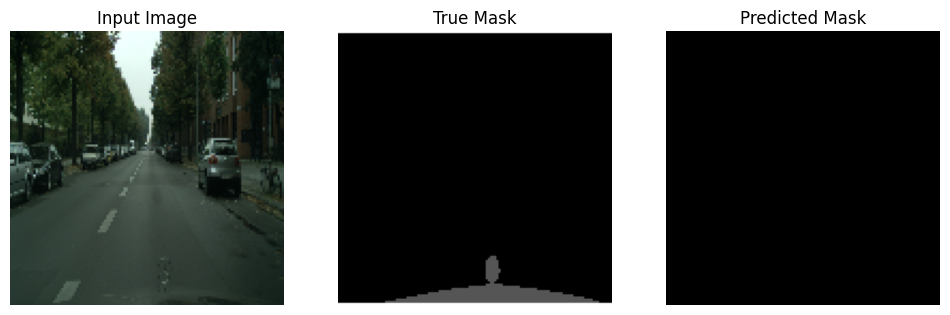

1/1 [==============================] - 0s 21ms/step


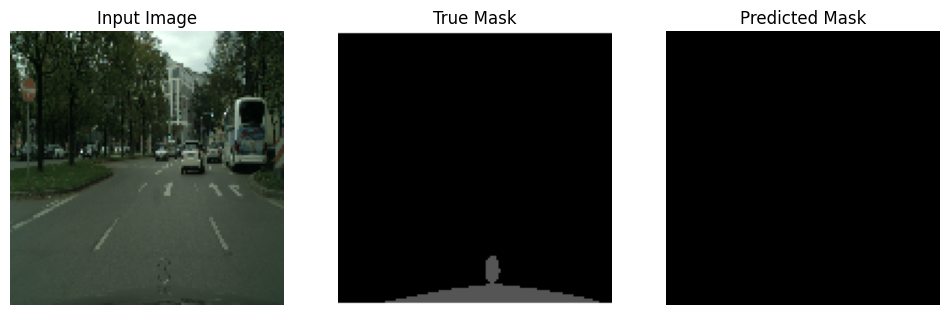

1/1 [==============================] - 0s 21ms/step


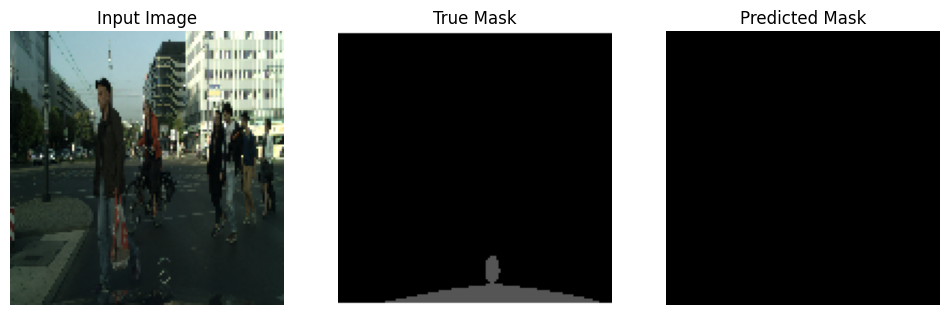

1/1 [==============================] - 0s 21ms/step


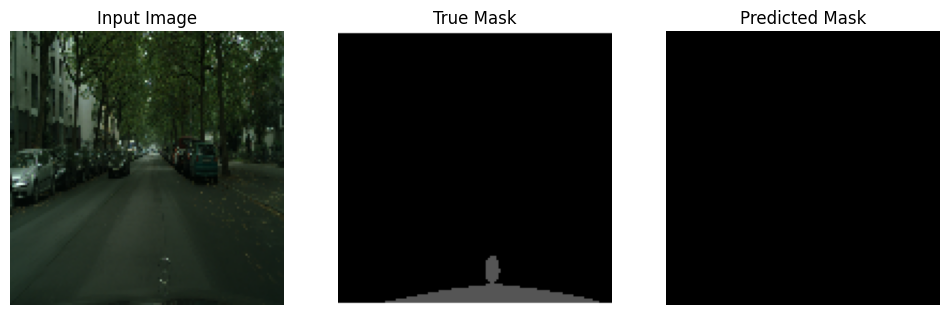

1/1 [==============================] - 0s 22ms/step


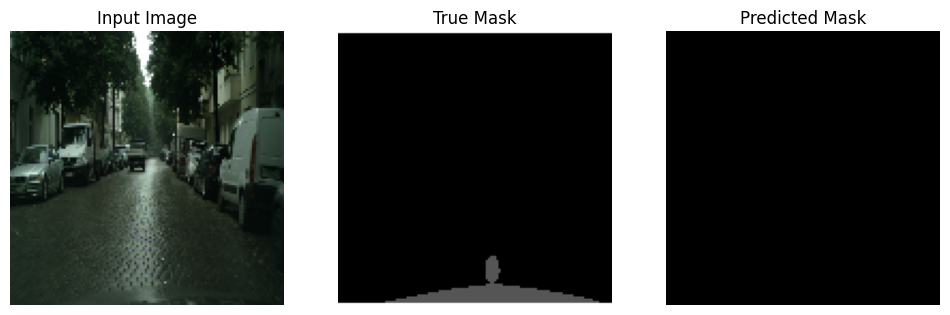

1/1 [==============================] - 0s 20ms/step


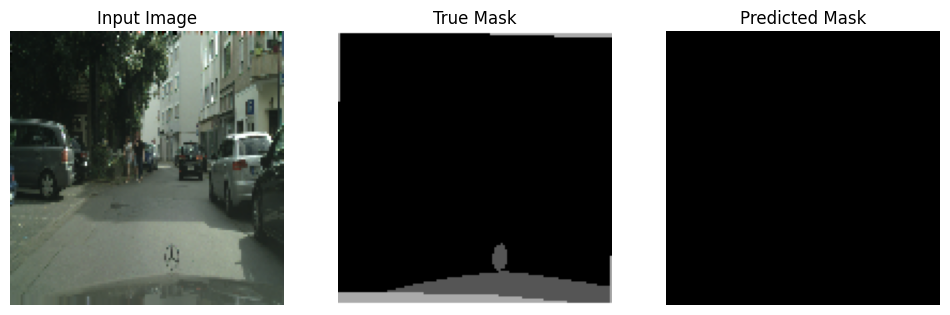

1/1 [==============================] - 0s 21ms/step


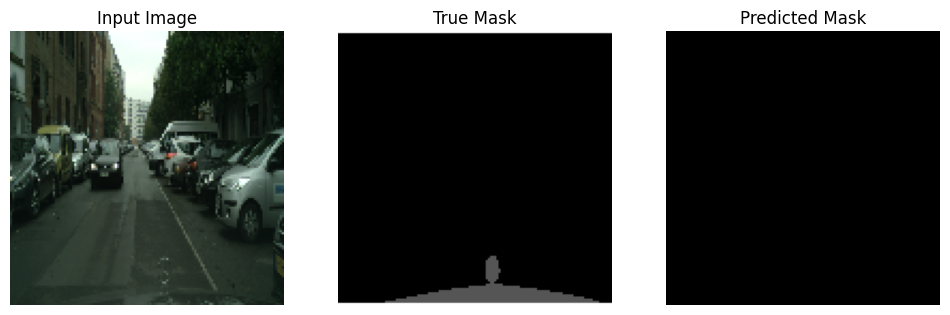

1/1 [==============================] - 0s 22ms/step


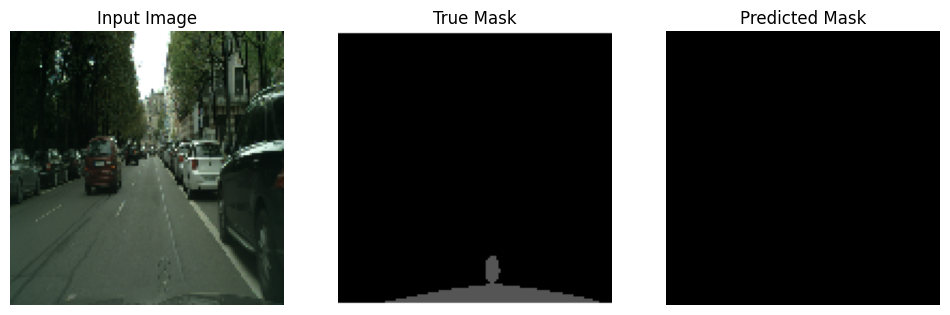

1/1 [==============================] - 0s 21ms/step


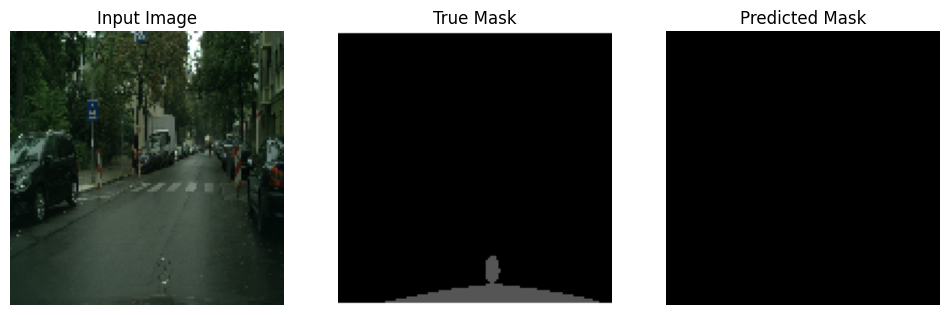

1/1 [==============================] - 0s 20ms/step


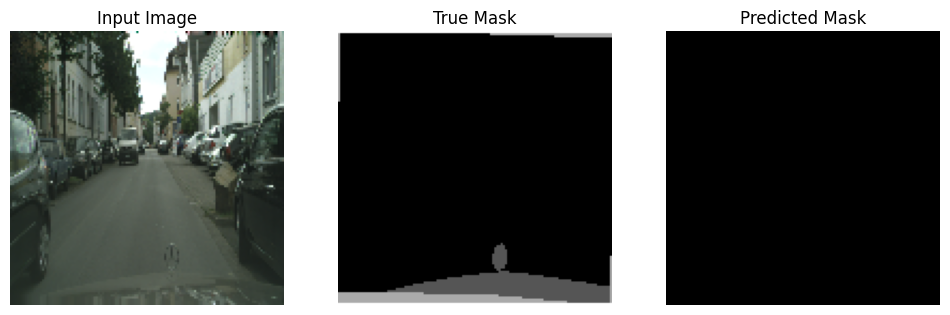

1/1 [==============================] - 0s 21ms/step


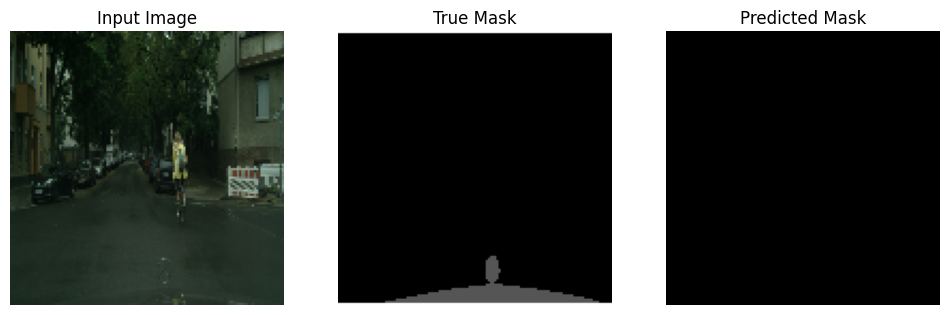

1/1 [==============================] - 0s 19ms/step


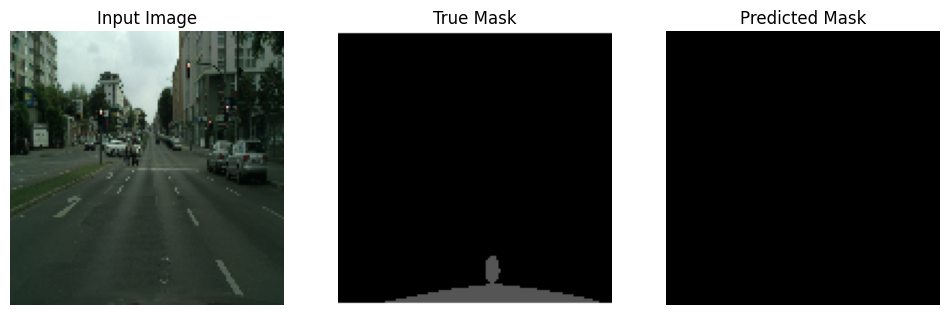

1/1 [==============================] - 0s 23ms/step


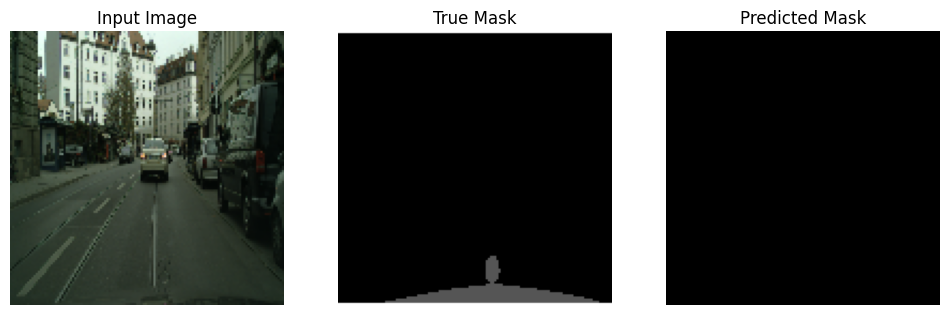

1/1 [==============================] - 0s 22ms/step


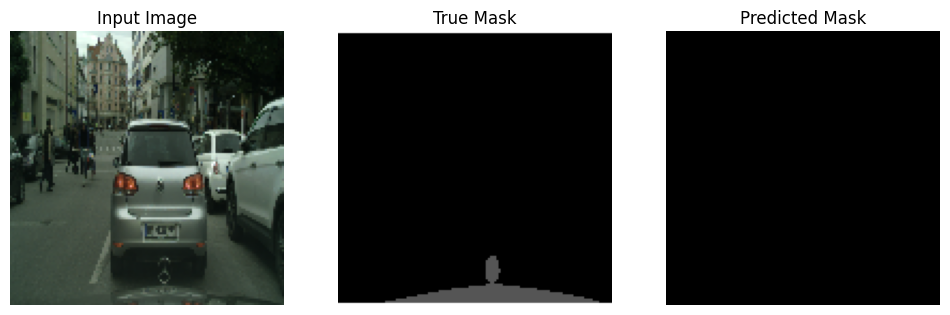

1/1 [==============================] - 0s 23ms/step


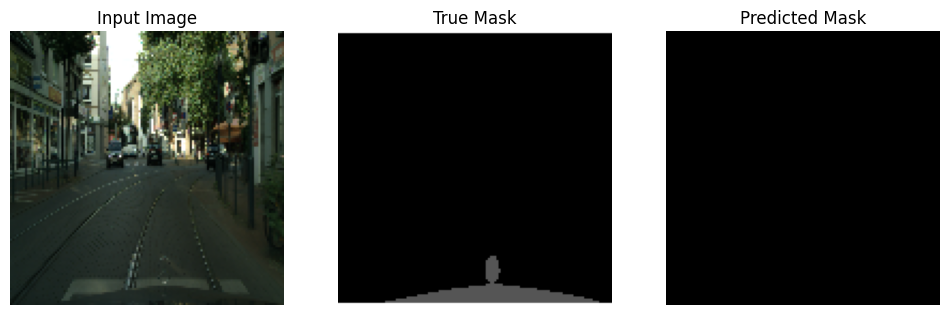

1/1 [==============================] - 0s 23ms/step


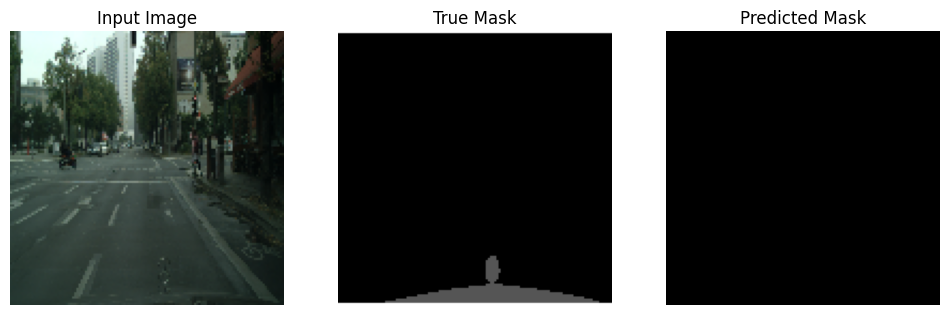

1/1 [==============================] - 0s 21ms/step


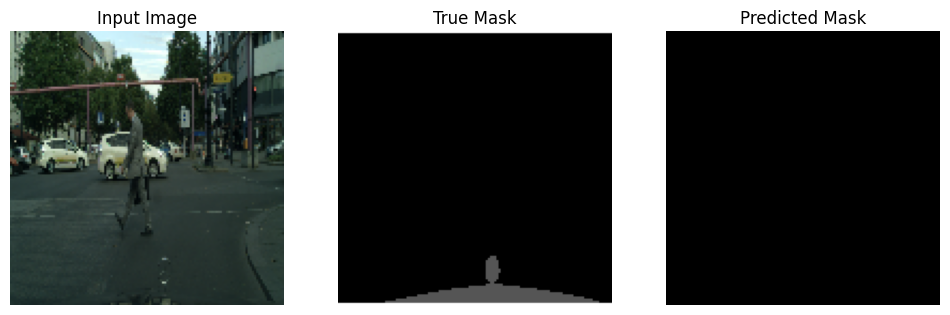

1/1 [==============================] - 0s 21ms/step


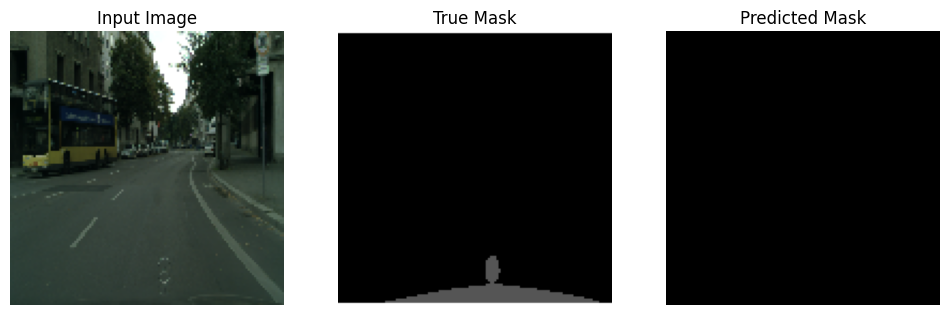

1/1 [==============================] - 0s 22ms/step


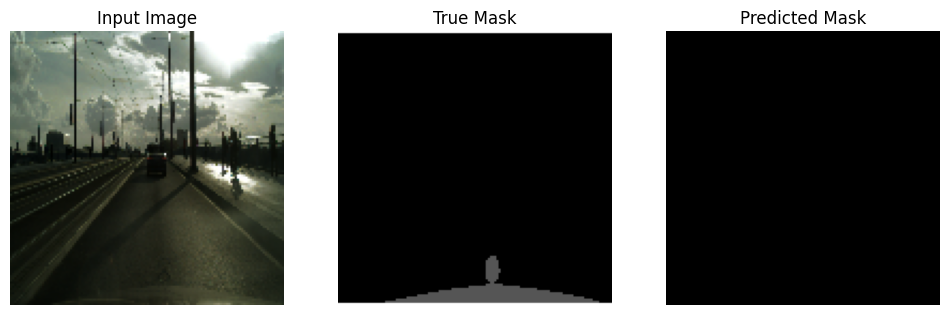

1/1 [==============================] - 0s 21ms/step


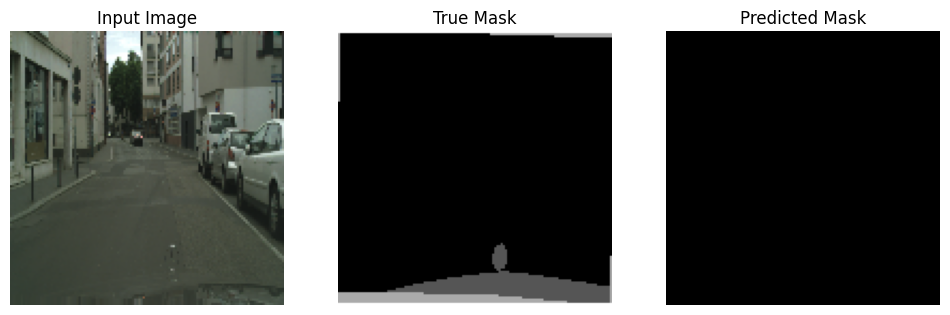

1/1 [==============================] - 0s 21ms/step


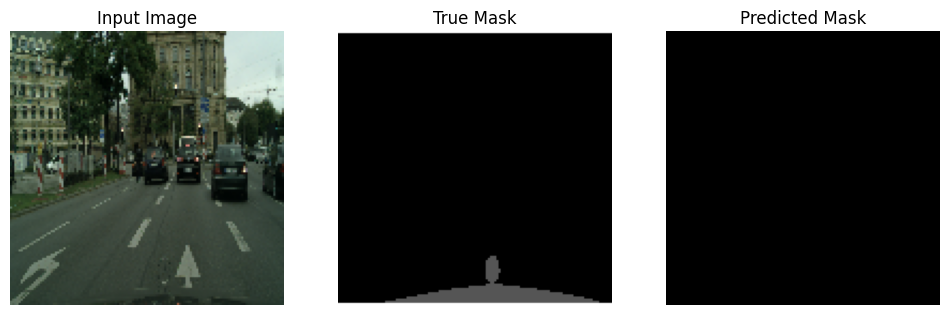

1/1 [==============================] - 0s 21ms/step


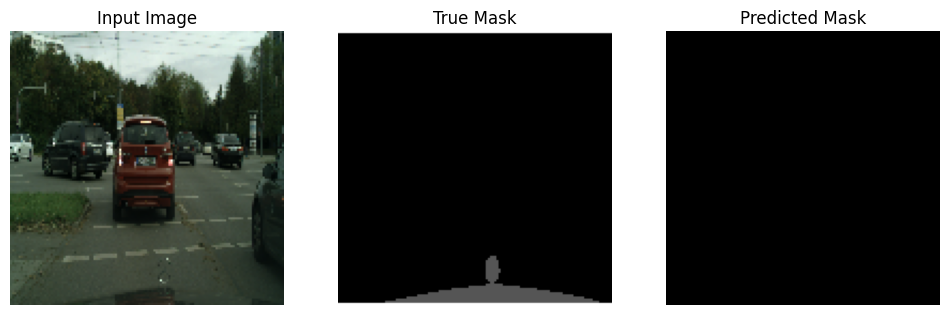

1/1 [==============================] - 0s 21ms/step


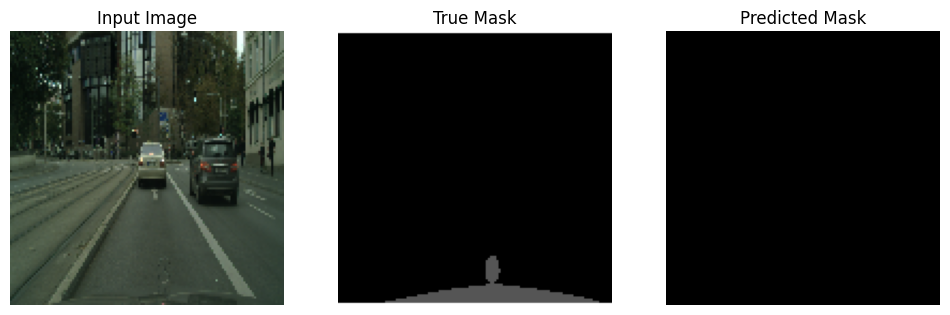

1/1 [==============================] - 0s 20ms/step


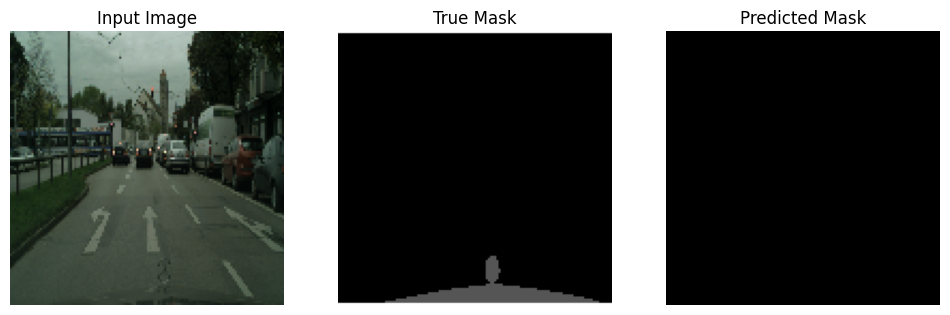

1/1 [==============================] - 0s 20ms/step


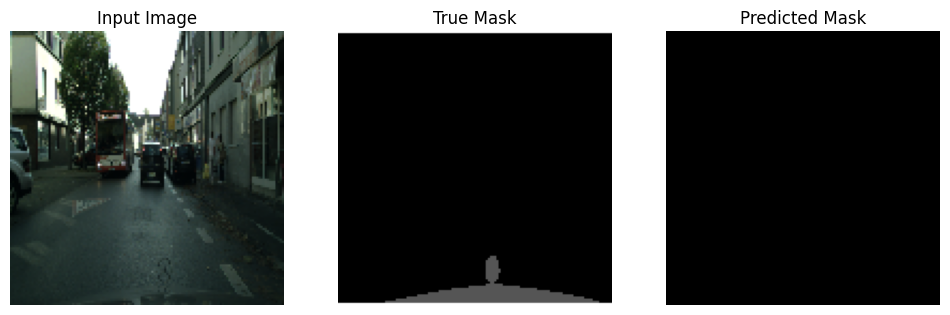

1/1 [==============================] - 0s 23ms/step


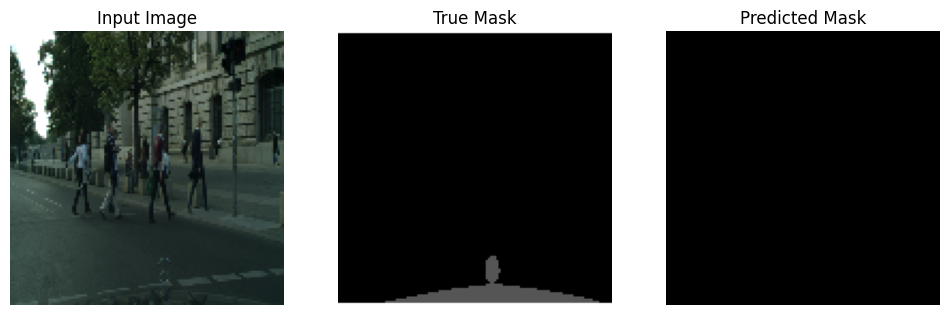

1/1 [==============================] - 0s 21ms/step


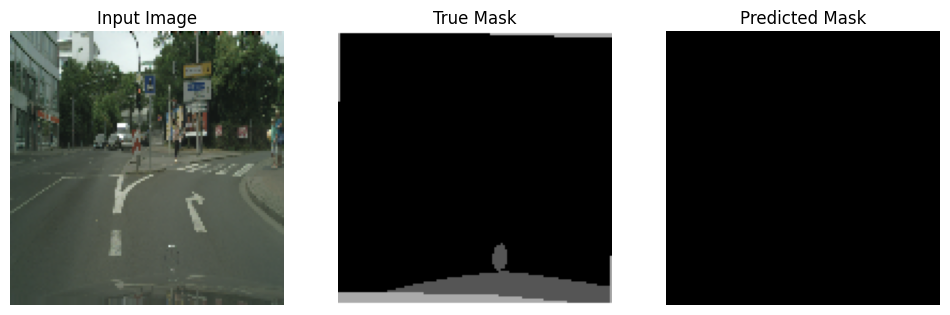

1/1 [==============================] - 0s 27ms/step


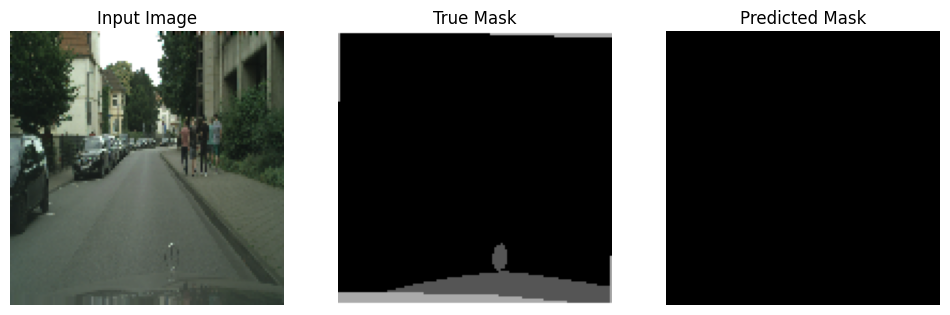

1/1 [==============================] - 0s 21ms/step


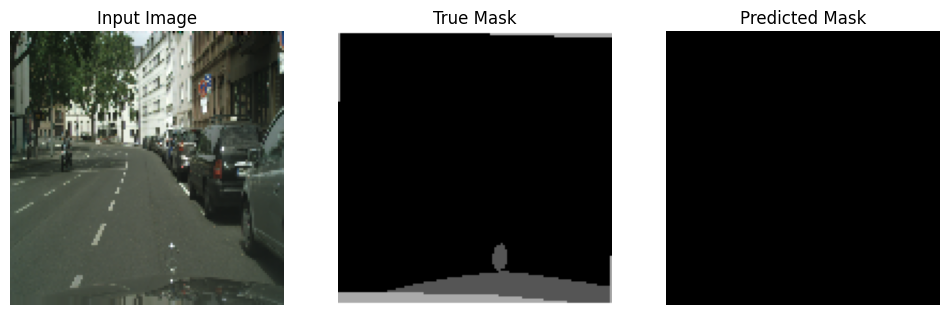

1/1 [==============================] - 0s 21ms/step


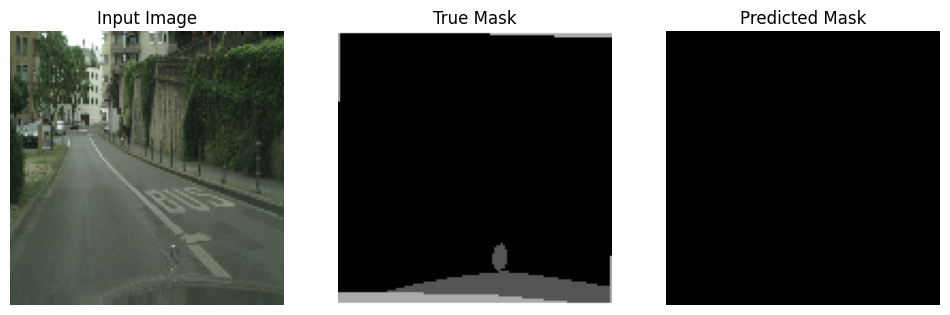

1/1 [==============================] - 0s 22ms/step


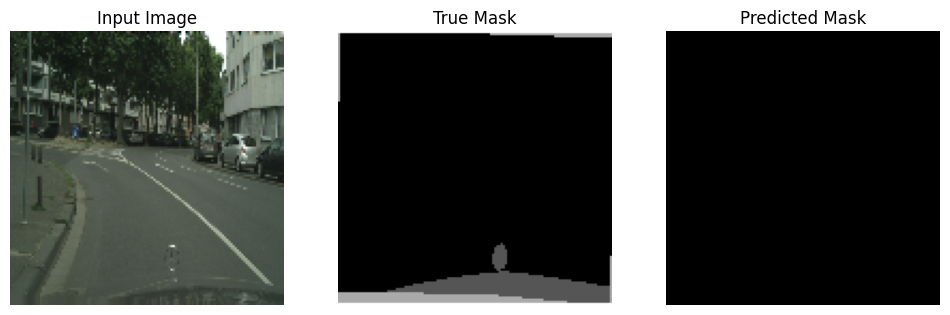

1/1 [==============================] - 0s 21ms/step


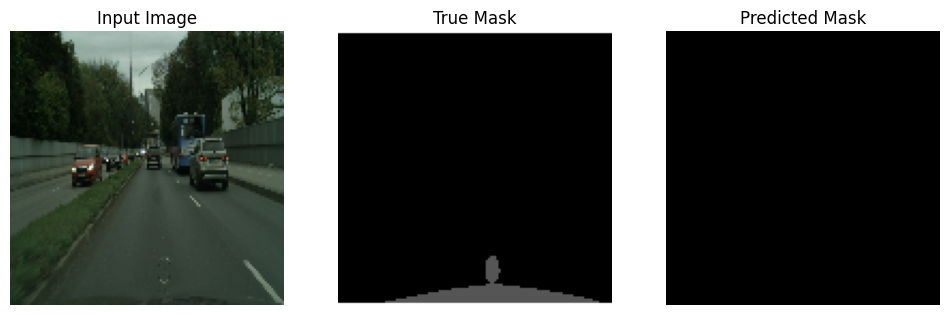

1/1 [==============================] - 0s 27ms/step


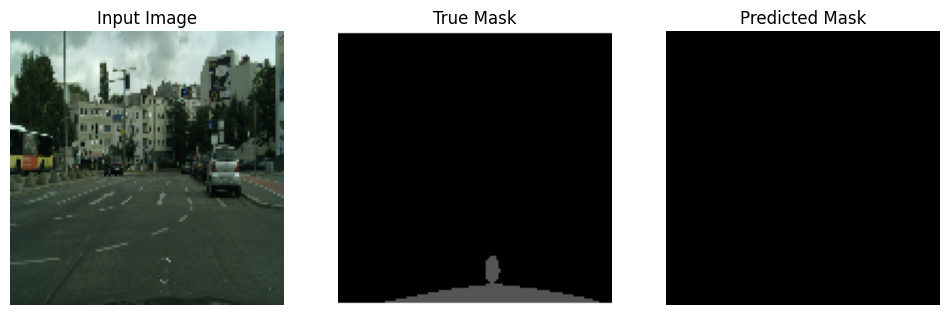

1/1 [==============================] - 0s 21ms/step


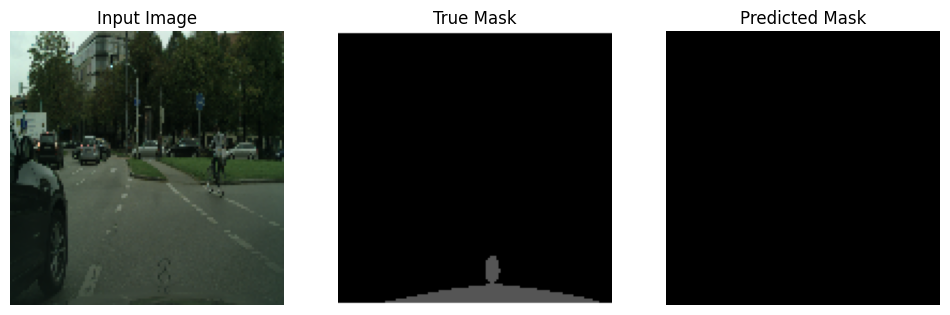

1/1 [==============================] - 0s 20ms/step


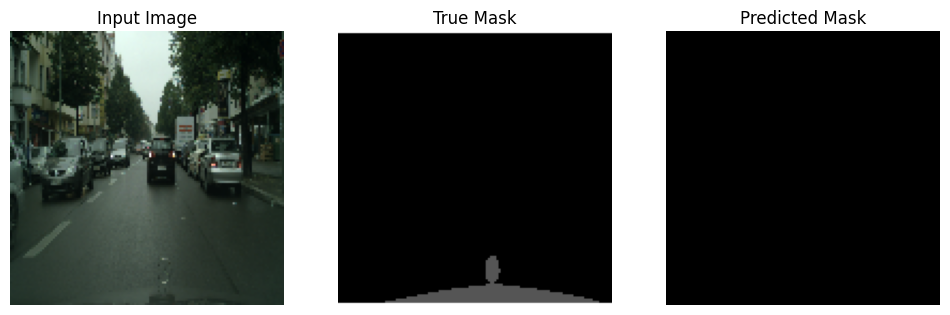

1/1 [==============================] - 0s 24ms/step


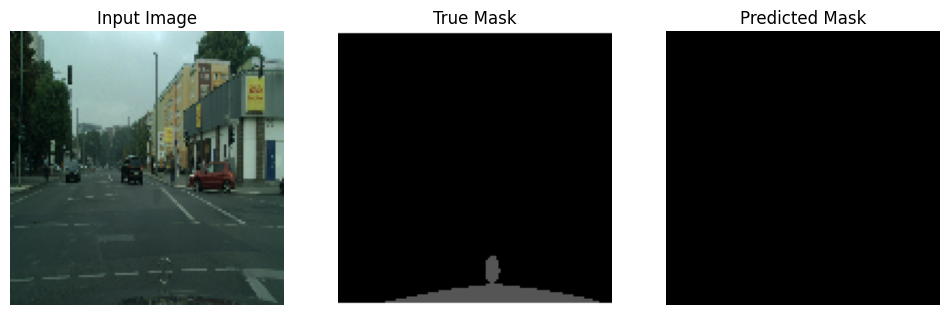

1/1 [==============================] - 0s 23ms/step


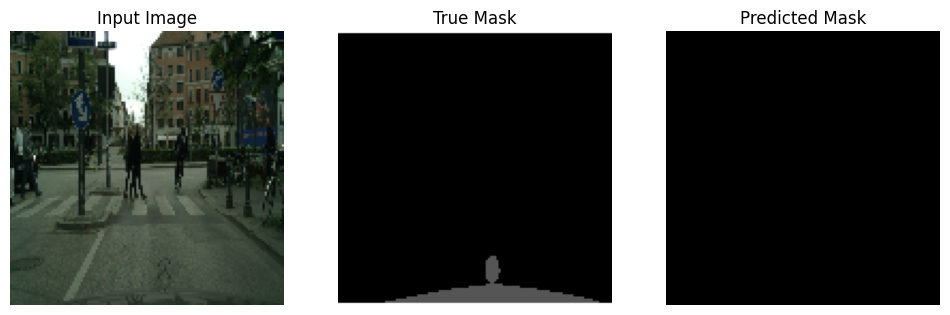

In [22]:
import os

# Define the display function
def display(display_list, save_path):
    plt.figure(figsize=(12, 4))  # Adjust the figure size to fit the three images
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])

        # If the display item is a mask, ensure it has 3 channels
        img = display_list[i]
        if len(img.shape) == 2:  # If the mask is 2D, expand it to 3D.
            img = np.expand_dims(img, axis=-1)
        if img.shape[-1] == 1:  # If there's only one channel, repeat it to simulate RGB.
            img = np.concatenate([img] * 3, axis=-1)

        plt.imshow(tf.keras.preprocessing.image.array_to_img(img))
        plt.axis('off')

    plt.savefig(save_path)  # Save the figure before displaying
    plt.show()

# Modify the show_predictions function to save each prediction with a unique filename
def show_predictions(dataset, model, num=1, save_dir='/content/drive/MyDrive/Colab Notebooks/kaggle_API_credentials/save_2_a/'):
    os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
    for idx, (images, masks) in enumerate(dataset.take(num)):
        preds = model.predict(images)
        display_list = [
            images[0].numpy(),  # Convert the first tensor to a numpy array
            masks[0].numpy(),
            create_mask(preds[0]).numpy()  # Convert the first prediction to a numpy array
        ]
        save_path = os.path.join(save_dir, f'prediction_{idx}.png')
        display(display_list, save_path)

# Usage Example
# Assuming `test_dataset` is your dataset and `unet_model` is your trained model
show_predictions(test_dataset, unet_model, num=100)
